# IMPORTAR LIBRERIAS

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os
import math as mt
import plotly.graph_objects as go
import plotly.express as px
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from sklearn.cluster import KMeans

import warnings
warnings.filterwarnings('ignore')

C:\Users\OT\AppData\Local\Temp\ipykernel_14740\1336828792.py:1: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


# CARGA DATOS

A partir de este punto, el análisis se centrará exclusivamente en el dataset a nivel nacional. Sin embargo, para investigaciones futuras, sería valioso considerar la exploración a nivel de comunidades autónomas. Este enfoque regional podría revelar patrones de consumo específicos y variaciones significativas entre diferentes regiones, proporcionando una visión más detallada y granular del comportamiento del consumo a nivel nacional. 

In [2]:
directorioSalida = './Dataset/Dataset_final/'
datosNacional_pk = os.path.join(directorioSalida, 'df_nacional_filtrado.pkl')

df_nacional_filtrado = pd.read_pickle(datosNacional_pk)

# ANALISIS EXPLORATORIO 

Iniciamos el análisis con un resumen descriptivo del consumo per cápita, enfocado en examinar las series temporales de consumo para cada tipo de alimento. El objetivo de este análisis descriptivo inicial es identificar los rangos de consumo de cada alimento a nivel nacional y proporcionar una visión general del patrón de consumo de cada uno. Este enfoque nos permitirá entender la distribución y variabilidad del consumo antes de realizar un análisis más detallado.

El análisis más específico de las series temporales correspondiente a la evaluación de la estacionalidad, tendencia y otros factores relevantes, se aplicará antes del modelado para identificar características clave para ajustar nuestros modelos de manera más precisa. Por tanto, puede encontrarse en el siguiente notebook.

In [3]:
pd.set_option('display.max_columns', None)
pd.options.display.float_format = '{:.2f}'.format
var_num = ['CONSUMO X CAPITA']
descriptivos_alimentos = df_nacional_filtrado.groupby('Alimentos')[var_num].describe()
descriptivos_alimentos

CONSUMO X CAPITA                                    
                                count mean  std  min  25%  50%  75%   max
Alimentos                                                                
ARROZ                          303.00 0.35 0.05 0.25 0.32 0.33 0.37  0.52
DERIVADOS LACTEOS              303.00 2.73 0.32 1.83 2.53 2.77 2.97  3.60
LEGUMBRES                      303.00 0.29 0.06 0.17 0.24 0.28 0.32  0.56
PAN                            303.00 3.19 0.61 2.08 2.70 3.07 3.68  4.67
PLATOS PREPARADOS              303.00 1.02 0.25 0.43 0.87 1.00 1.20  1.66
T.FRUTAS FRESCAS               303.00 7.91 1.11 5.23 7.12 7.93 8.63 11.45
T.HORTALIZAS FRESCAS           303.00 4.90 0.64 3.54 4.46 4.96 5.29  7.08
T.HUEVOS KGS                   303.00 0.74 0.08 0.59 0.69 0.73 0.79  1.09
TOTAL CARNE                    303.00 4.18 0.62 2.72 3.75 4.17 4.56  5.79
TOTAL LECHE LIQUIDA            303.00 6.54 0.98 4.60 5.81 6.40 7.15  9.39
TOTAL PASTAS                   303.00 0.33 0.05 0.23 0.30 0.33 0.36  0.58
TOTAL PESCA                    303.00 2.14 0.34 1.32 1.93 2.15 2.32  3.46

Complementamos la tabla descriptiva con diagramas de caja y bigotes y histogramas que ilustran la distribución del consumo para cada alimento. Estos gráficos visuales permiten una comprensión más clara de la variabilidad y las distribuciones de consumo, facilitando la identificación de patrones y anomalías que pueden ser cruciales para el análisis posterior. 

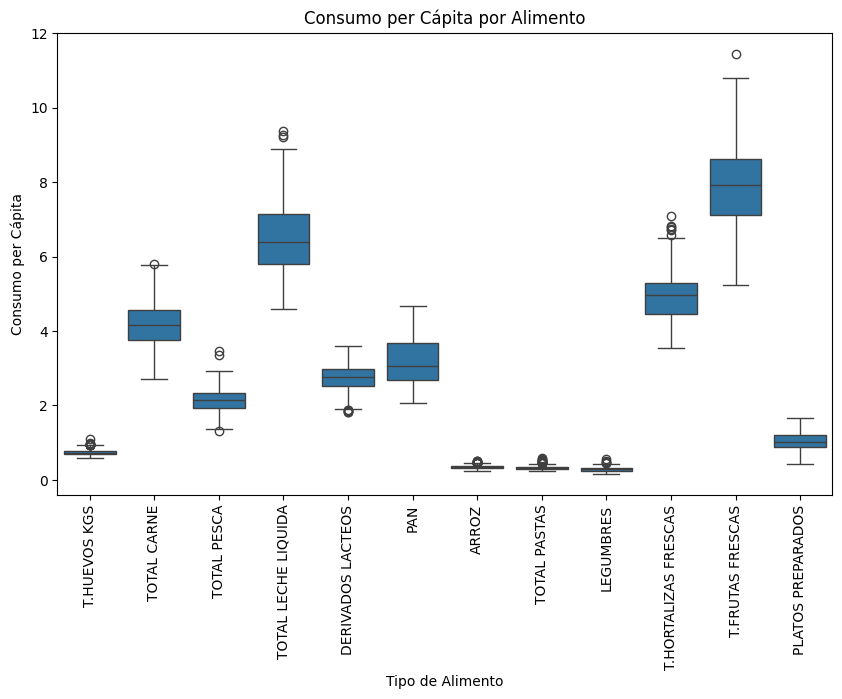

In [4]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='Alimentos', y='CONSUMO X CAPITA', data=df_nacional_filtrado)

plt.title('Consumo per Cápita por Alimento')
plt.xlabel('Tipo de Alimento')
plt.ylabel('Consumo per Cápita')
plt.xticks(rotation=90) 

plt.show()

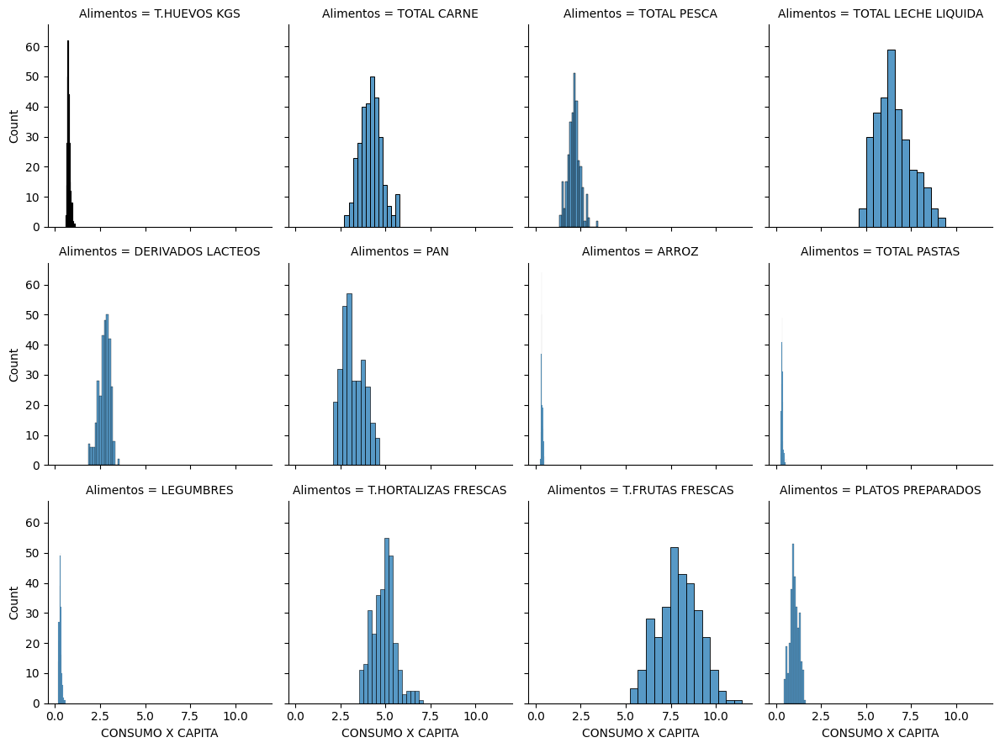

In [5]:
g = sns.FacetGrid(df_nacional_filtrado, col="Alimentos", col_wrap=4, height=3, aspect=1)
g.map(sns.histplot, "CONSUMO X CAPITA")
plt.show()

El análisis de consumo per cápita a nivel nacional revela que las frutas frescas y la leche líquida son los grupos de alimentos con el mayor consumo promedio. En contraste, los productos derivados de lácteos, carne, pescado, hortalizas, pan y platos preparados presentan niveles de consumo moderado y por último, el grupo de: arroz, legumbres, pastas y huevos tienen los consumos más bajos.


**Un examen más detallado de los datos, utilizando tanto histogramas como diagramas de caja y bigotes, muestra que los grupos de alimentos correspondientes a huevos, arroz, pastas y legumbres tienen una variabilidad muy baja. Esta baja variabilidad sugiere que el consumo de estos alimentos es bastante estable a lo largo del tiempo.**

**Debido a esta estabilidad, estos grupos de alimentos no se considerarán para la modelización de series temporales en el análisis posterior. La baja variabilidad en el consumo indica que estos alimentos podrían no proporcionar información significativa para los modelos destinados a identificar patrones o cambios en el tiempo.**

A continuación, se presentan las correlaciones lineales entre las variables numéricas del dataset, tanto a nivel general como por tipo de alimento.

<Axes: >

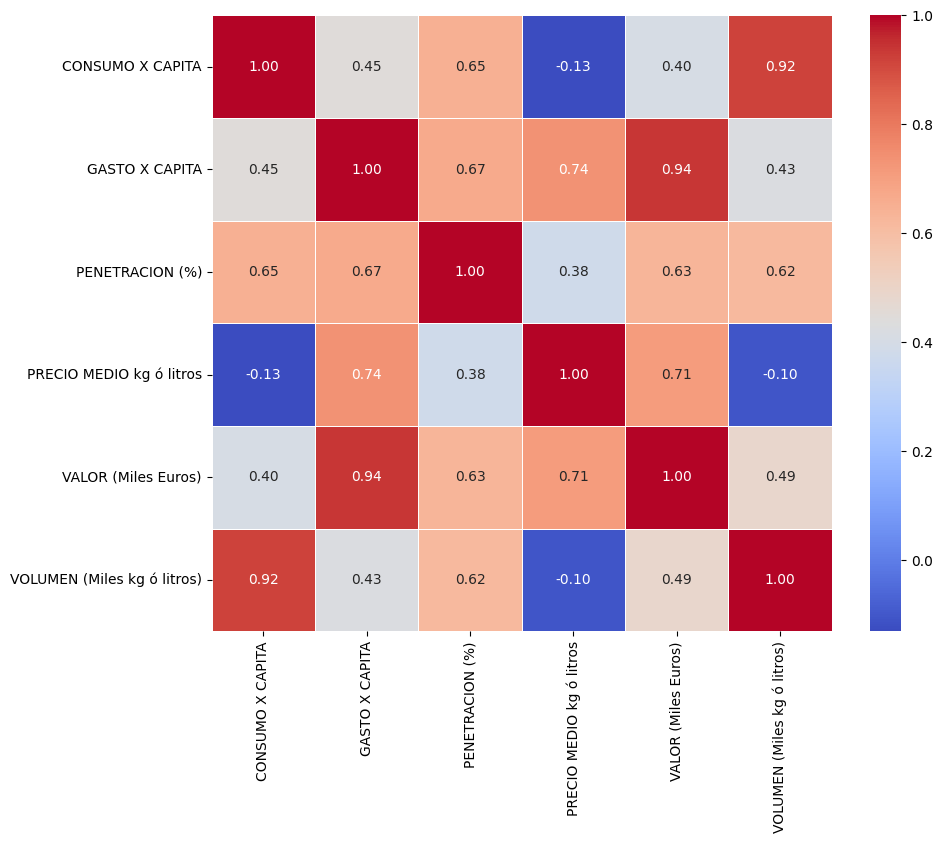

In [6]:
var_num= df_nacional_filtrado[['CONSUMO X CAPITA', 'GASTO X CAPITA', 'PENETRACION (%)',
                                'PRECIO MEDIO kg ó litros', 'VALOR (Miles Euros)', 
                                'VOLUMEN (Miles kg ó litros)']].copy()
R = var_num.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(R, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)

En la matriz de correlación general anterior, se observa una relación directa entre el consumo per cápita y el volumen total, ya que el consumo per cápita se calcula como el volumen total dividido por la población. De manera similar, el valor total tiene una correlación directa con el gasto per cápita, puesto que este último se determina dividiendo el valor total entre la misma población. También se observa una correlación menor entre el valor total y el precio, dado que el precio afecta el cálculo del gasto per cápita.

Para mitigar problemas de colinealidad en futuros análisis, se recomienda excluir las variables de valor y volumen si se incorporan variables exógenas en el modelado. Esta medida ayudará a evitar redundancias y a mejorar la precisión y la interpretabilidad de los modelos.

También se detecta una correlación baja pero inversa entre el consumo per cápita y el precio medio de los alimentos, lo que sugiere que el consumo tiende a disminuir a medida que los precios aumentan, aunque la relación lineal observada es muy débil. Además, se identifica una correlación moderada entre el gasto per cápita, la penetración del consumo y el consumo per cápita. Esto indica que un mayor consumo está asociado con un mayor gasto y una mayor aceptación de los alimentos por parte de la población.

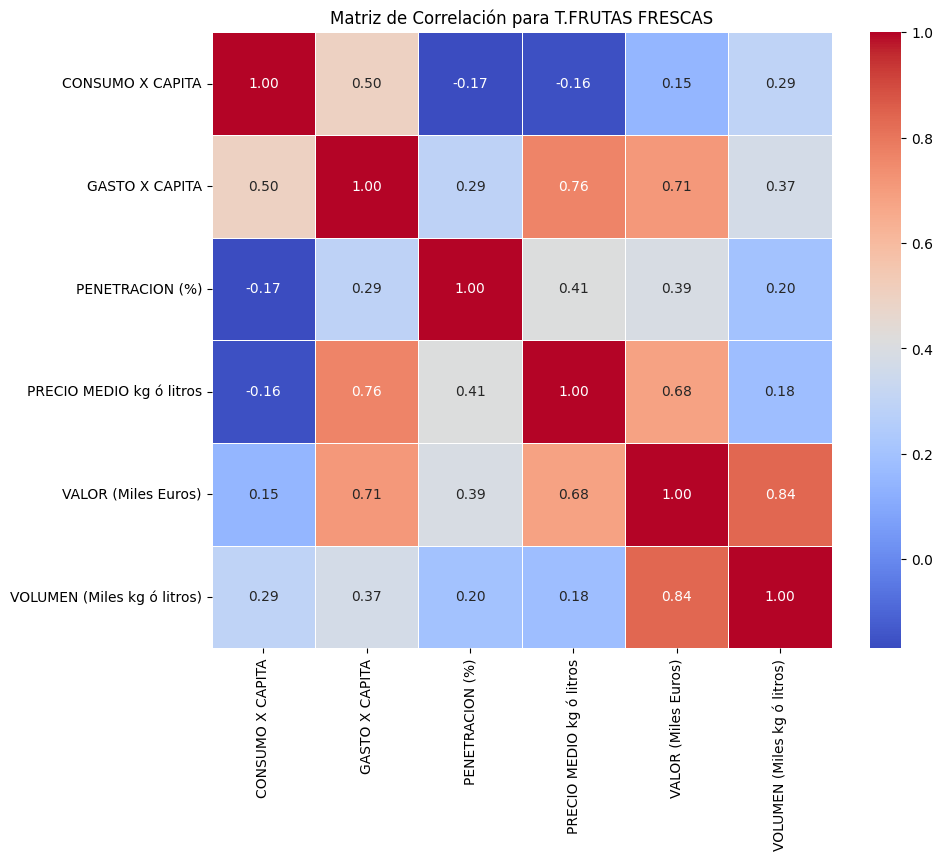

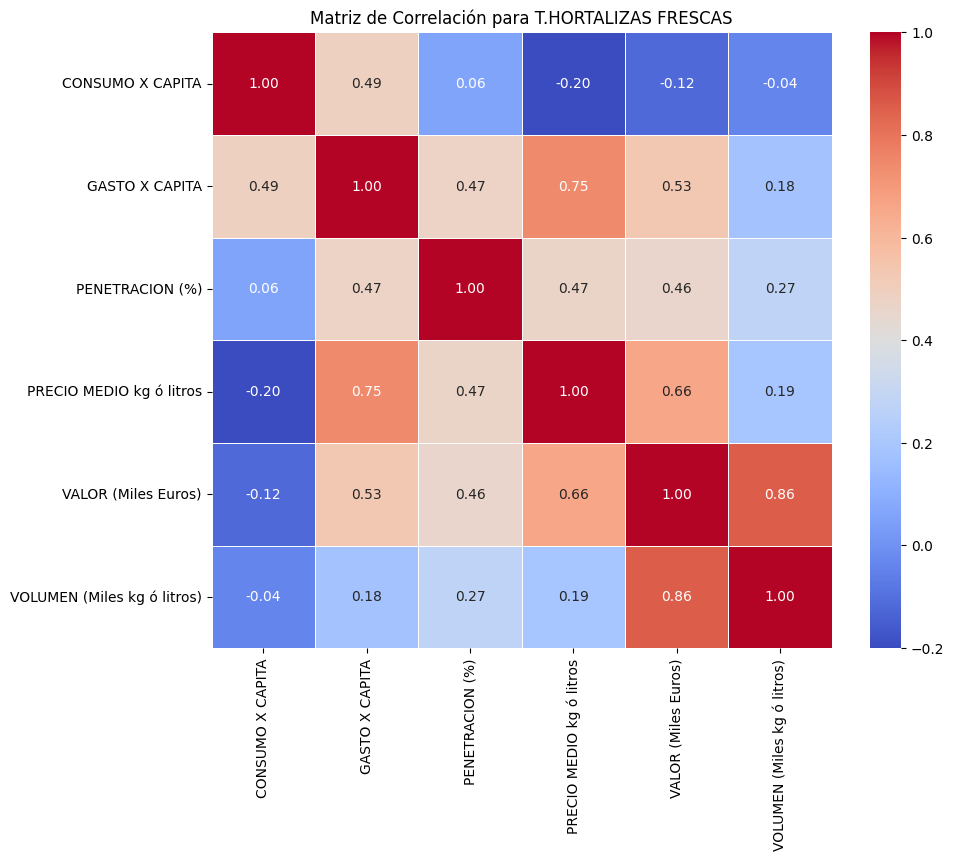

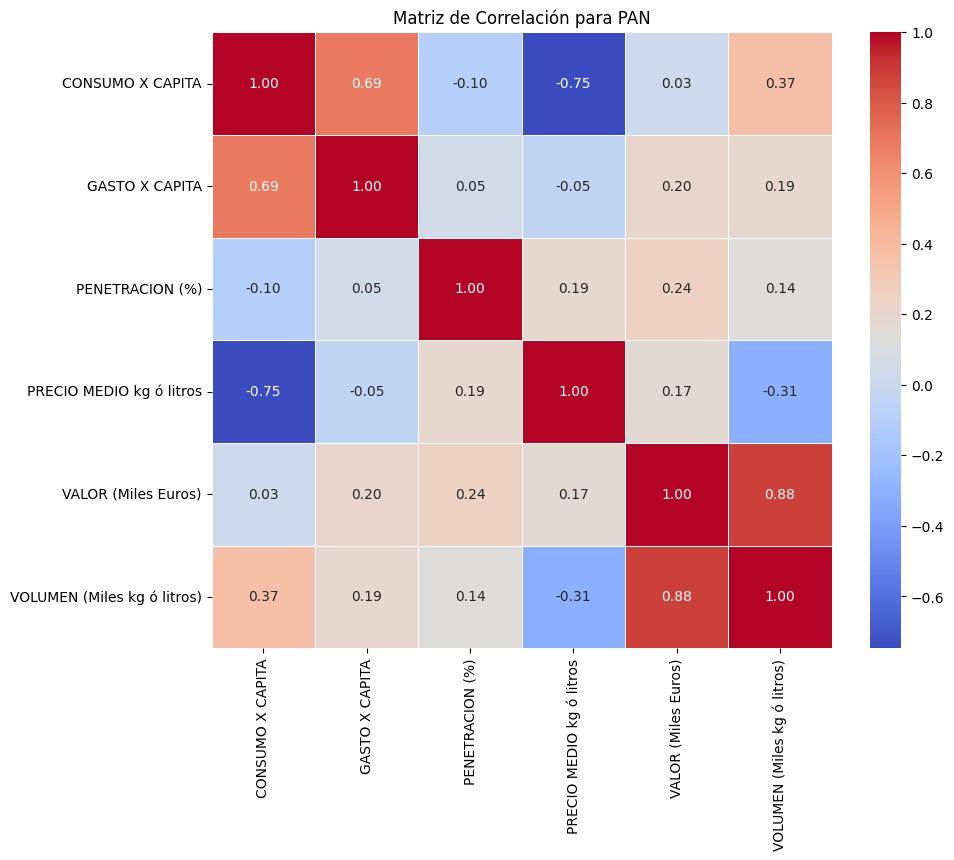

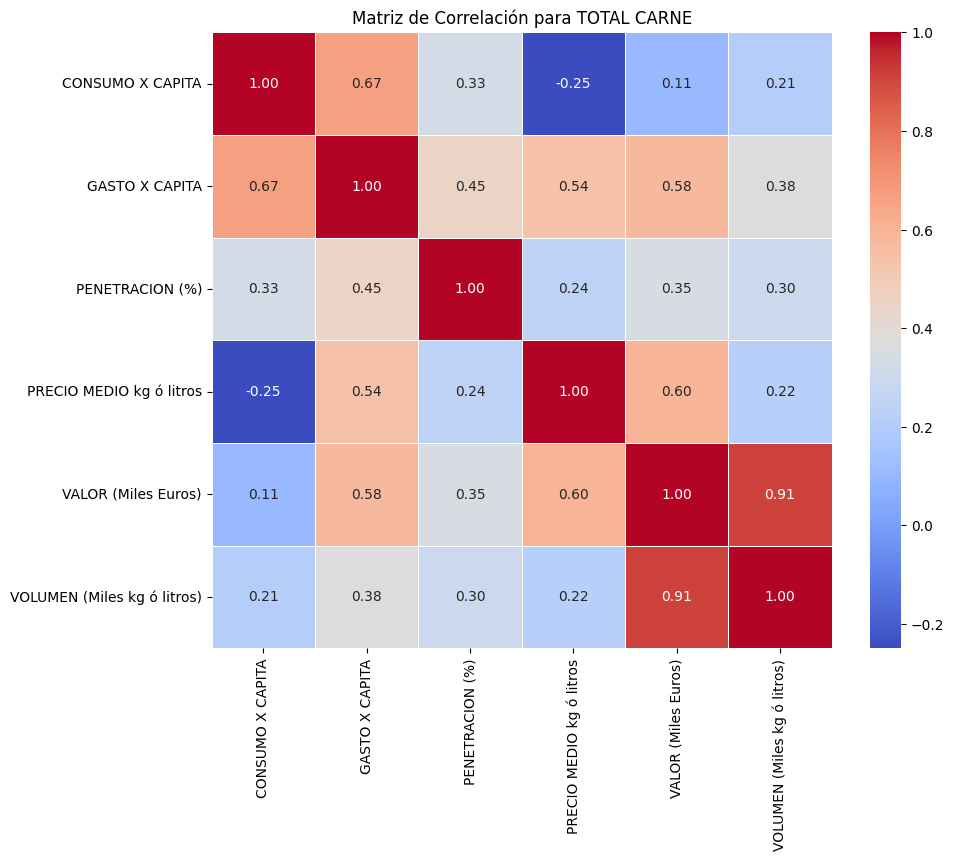

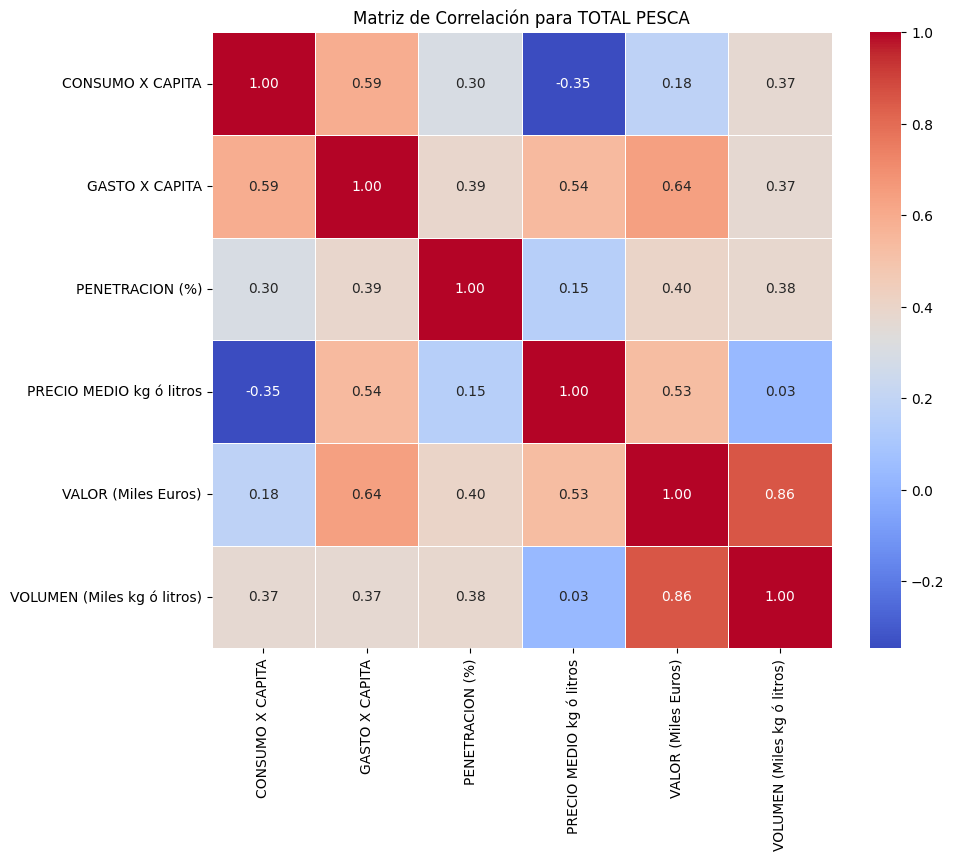

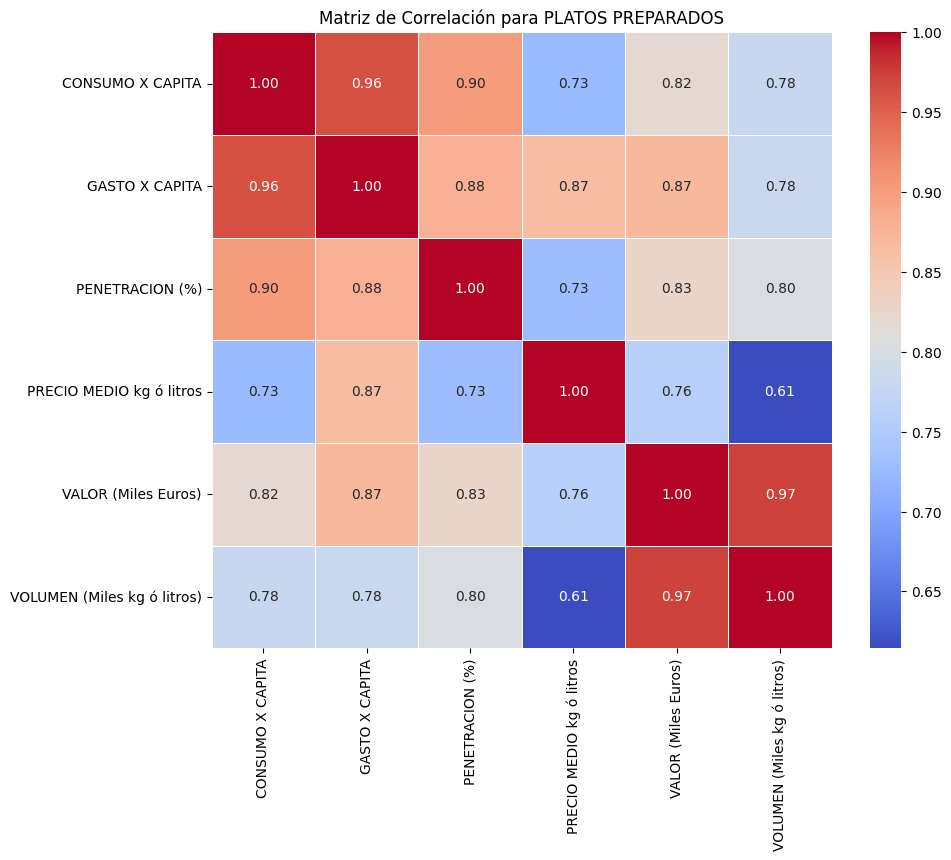

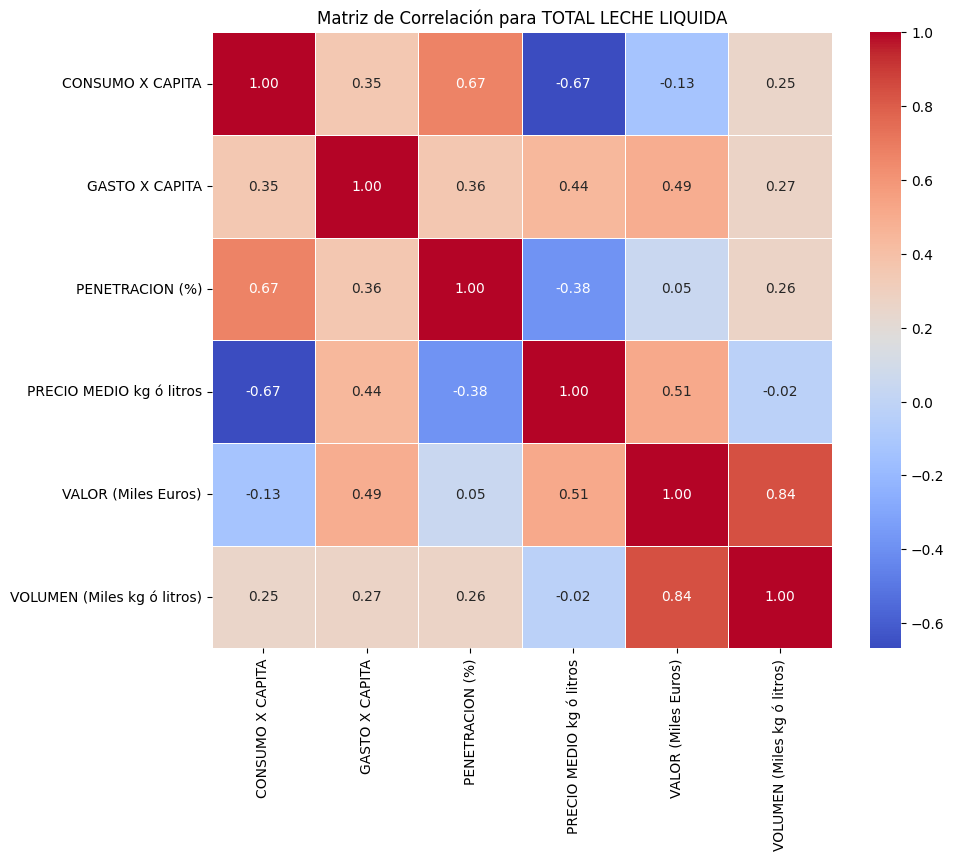

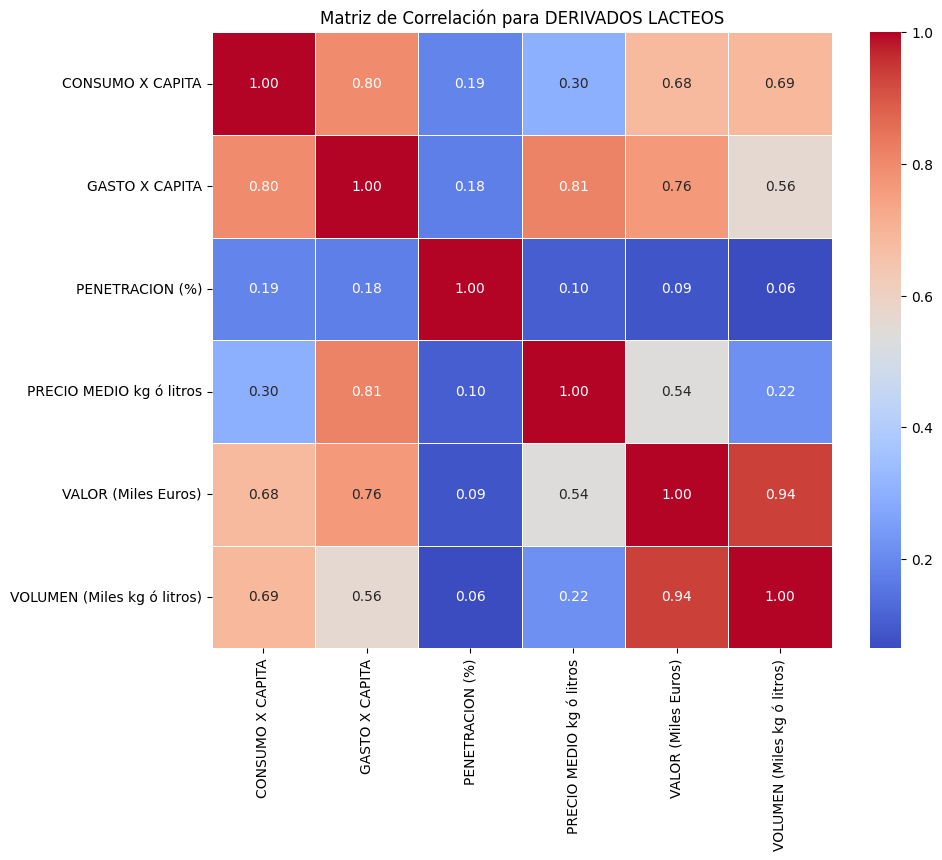

In [7]:
seleccion_alimentos = ['T.FRUTAS FRESCAS', 'T.HORTALIZAS FRESCAS',  'PAN',
                       'TOTAL CARNE', 'TOTAL PESCA', 'PLATOS PREPARADOS',
                       'TOTAL LECHE LIQUIDA', 'DERIVADOS LACTEOS']
for alimento in seleccion_alimentos:
    # Filtrar datos para el alimento actual
    df_alimento = df_nacional_filtrado[df_nacional_filtrado['Alimentos'] == alimento]

    # Asegúrate de que 'Alimento' no esté incluido en la matriz de correlación
    var_num = df_alimento[['CONSUMO X CAPITA', 'GASTO X CAPITA', 'PENETRACION (%)',
                           'PRECIO MEDIO kg ó litros', 'VALOR (Miles Euros)', 
                           'VOLUMEN (Miles kg ó litros)']]
    
    # Calcular la matriz de correlación
    R = var_num.corr()
    
    # Crear una figura y un gráfico
    plt.figure(figsize=(10, 8))
    sns.heatmap(R, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
    plt.title(f'Matriz de Correlación para {alimento}')
    
    # Almacenar la figura
    
    plt.show()

En el análisis de las matrices de correlación por tipo de alimento, se destacan varias observaciones importantes. Se observa una relación inversa moderada entre el precio medio y el consumo per cápita para la leche líquida y el pan, indicando que a medida que el precio de estos productos aumenta, el consumo tiende a disminuir. Por otro lado, para los platos preparados, se encuentra una relación directa moderada entre el precio y el consumo per cápita; esto sugiere que un aumento en el consumo puede llevar a un incremento en los precios debido a una mayor demanda.

Además, se identifica una fuerte correlación entre el consumo per cápita y el gasto per cápita en platos preparados y derivados lácteos, mientras que para otros alimentos la relación es moderada, siguiendo una tendencia general. También se observa una fuerte correlación entre el consumo per cápita y la penetración del producto para la leche líquida y los platos preparados, lo que indica que un mayor consumo está asociado con una mayor disponibilidad y aceptación de estos productos en el mercado.

Este análisis sugiere que las correlaciones lineales moderadas entre el gasto per cápita y la penetración, con respecto la variable a predecir, pueden ser útiles como factores exógenos en la modelización del consumo per cápita. Además, el desglose por tipo de alimento muestra que el precio medio tiene una correlación significativa con ciertas series, lo cual puede ser un indicativo a tener en cuenta para definir la variable a predecir. Aunque el análisis general para el precio medio no muestre una correlación moderada o fuerte, cabe mencionar que se basa en relaciones lineales, por éste motivo, y viendo el desglose por tipo de alimento no se descarta la inclusión del precio medio como variable relevante en el modelo final.

A continuación, se presenta una matriz de correlación del consumo per cápita entre diferentes grupos de alimentos, con el objetivo de identificar posibles relaciones en los patrones de consumo.

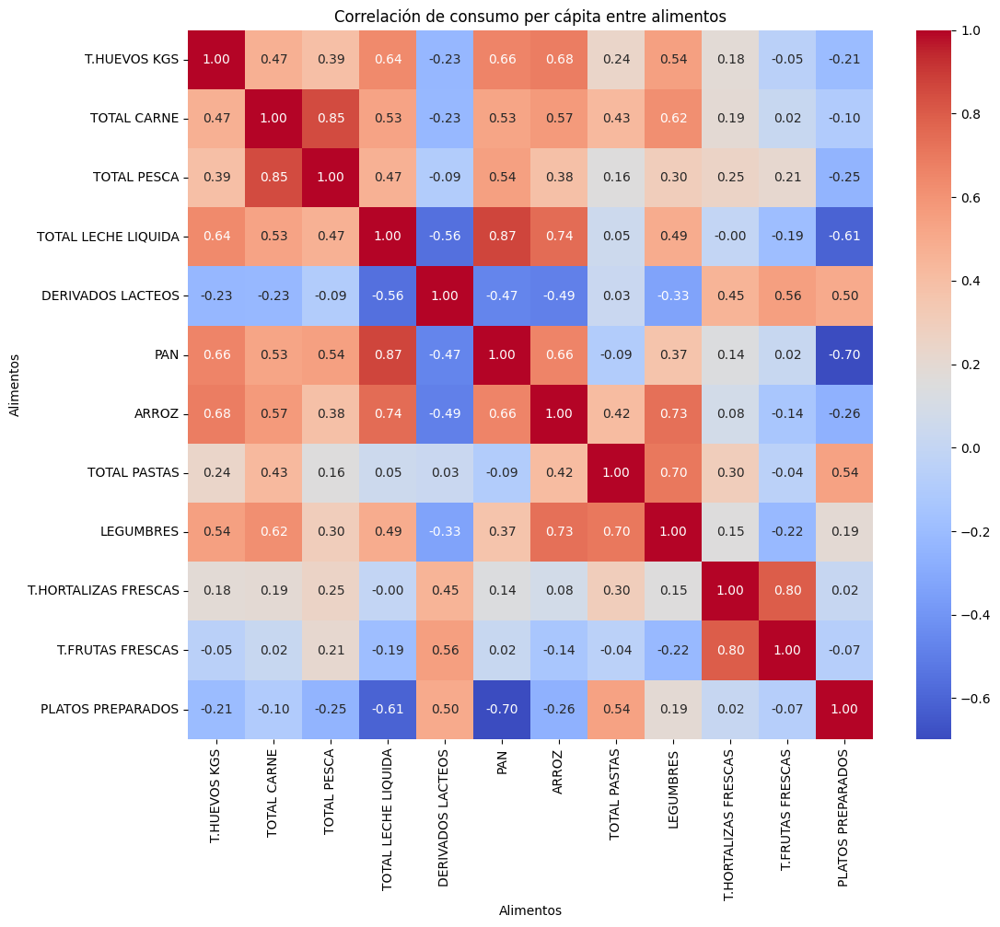

In [8]:
tabla_alimentos= df_nacional_filtrado.pivot_table(index=[ 'Año', 'Mes'], columns='Alimentos', values='CONSUMO X CAPITA').reset_index()
corr_alimentos = tabla_alimentos[df_nacional_filtrado['Alimentos'].unique()].corr()

plt.figure(figsize=(12, 10))
sns.heatmap(corr_alimentos, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlación de consumo per cápita entre alimentos')
plt.show()

En el análisis de la matriz de correlación, se observa una relación inversa significativa entre el consumo de platos preparados y el de otros grupos de alimentos, excepto en el caso de los derivados lácteos y las pastas. Este patrón sugiere que un alto consumo de alimentos preparados podría estar asociado con una dieta menos variada o, potencialmente, menos equilibrada en términos de nutrición.

Por otro lado, se destaca una alta correlación entre el consumo de frutas y hortalizas, lo que indica un patrón alimentario que se alinea con una dieta saludable y una preferencia por alimentos frescos. Este hallazgo sugiere que los consumidores que incorporan frutas y hortalizas en su dieta tienden a hacerlo de manera consistente, reflejando una orientación hacia hábitos alimenticios saludables. 
También se observa una correlación notable entre el consumo de pan y leche líquida. Esta relación podría estar vinculada a hábitos de consumo comunes, como los asociados con el desayuno, donde estos alimentos son frecuentemente consumidos juntos. Este patrón destaca una posible sincronía en las preferencias alimentarias diarias de los consumidores.

Una observación significativa es la alta correlación entre el consumo de carne y pescado. Este patrón sugiere que las personas que consumen grandes cantidades de carne también tienden a incluir pescado en su dieta de manera considerable. Esta asociación podría reflejar una preferencia general por las proteínas animales, indicando que los consumidores que priorizan uno de estos alimentos suelen equilibrar su ingesta con el otro. Esta tendencia puede estar influenciada por factores como las recomendaciones dietéticas que promueven un consumo equilibrado de diferentes fuentes de proteínas, o hábitos culturales que valoran tanto la carne como el pescado como componentes clave de una dieta variada. Además, puede haber una tendencia a elegir estas opciones de proteínas animales en lugar de otras fuentes menos comunes en la dieta, lo que refuerza la idea de que carne y pescado son vistos como complementarios en las dietas a nivel nacional.

Por otro lado, se observa una relación inversa moderada entre el consumo de leche líquida y derivados lácteos. Este hallazgo indica que las personas que consumen grandes cantidades de leche líquida tienden a reducir su consumo de otros productos lácteos, como yogur o quesos, y viceversa. Este patrón podría reflejar una preferencia por un tipo específico de producto lácteo dentro del grupo. Los consumidores que prefieren la leche líquida pueden sentir menos necesidad de diversificar su ingesta láctea con derivados como quesos o yogures. Alternativamente, puede tratarse de un patrón de sustitución, donde el aumento en el consumo de leche líquida lleva a una disminución en la cantidad de otros productos lácteos consumidos, o viceversa.Este comportamiento podría estar relacionado con la percepción de los productos lácteos, donde los consumidores eligen concentrarse en uno o en otro en función de sus preferencias personales o necesidades dietéticas específicas. Este patrón de sustitución puede ser importante para entender cómo los consumidores distribuyen su ingesta de productos lácteos y cómo estas preferencias afectan el mercado de estos productos.

Seguidamente se representan las diferentes variables del dataset frente a la variable principal, consumo per cápita, para cada tipo de alimento. Este análisis visual permitirá identificar agrupaciones específicas y patrones relevantes en los datos, ayudando a entender mejor cómo cada variable se relaciona con el consumo per cápita y a detectar posibles tendencias o comportamientos agrupados.

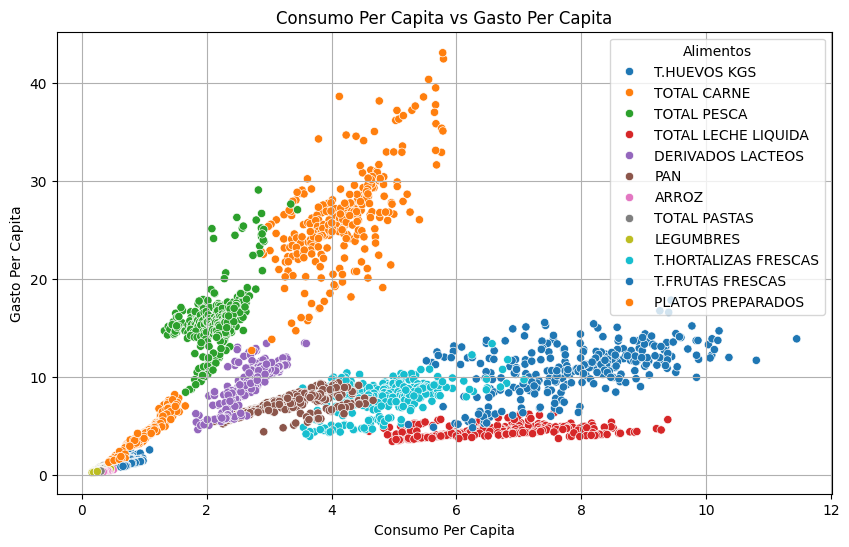

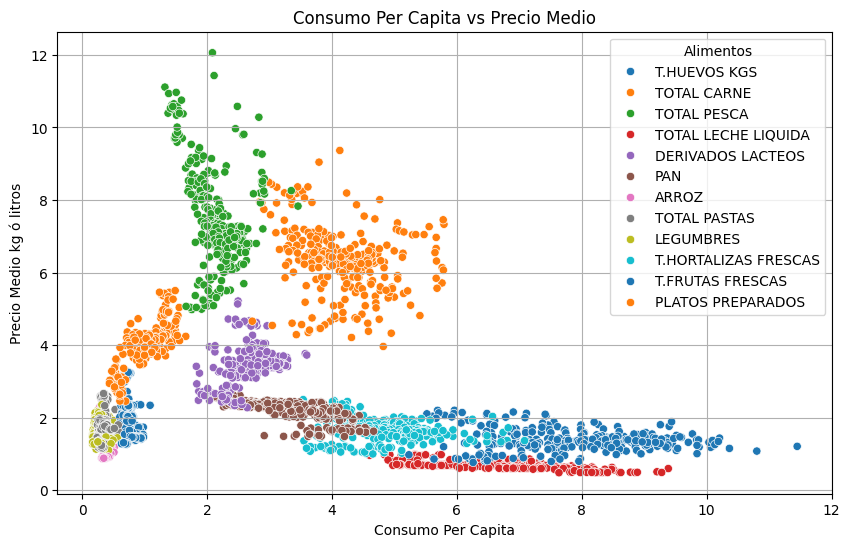

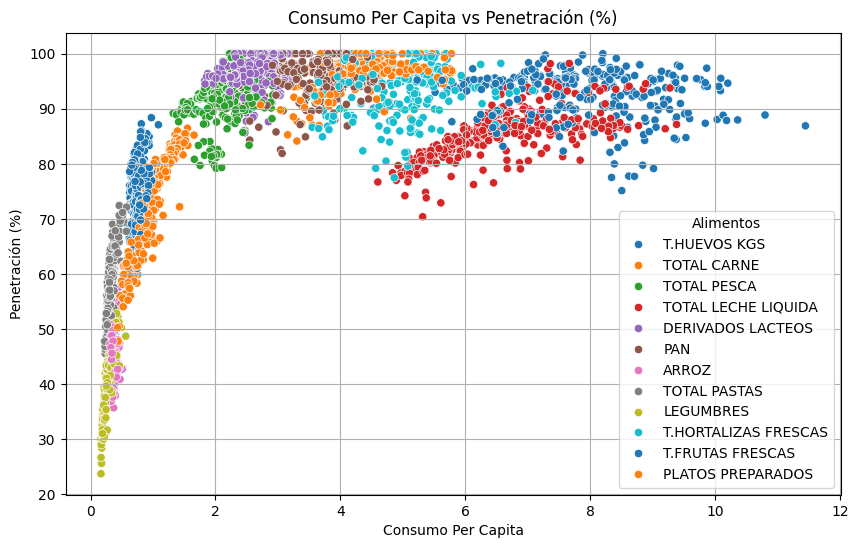

In [9]:

# Gráfico de dispersión entre CONSUMO X CAPITA y GASTO X CAPITA
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_nacional_filtrado, x='CONSUMO X CAPITA', y='GASTO X CAPITA', hue='Alimentos', palette='tab10')
plt.title('Consumo Per Capita vs Gasto Per Capita')
plt.xlabel('Consumo Per Capita')
plt.ylabel('Gasto Per Capita')
plt.legend(title='Alimentos')
plt.grid(True)
plt.show()

# Gráfico de dispersión entre CONSUMO X CAPITA y PRECIO MEDIO kg ó litros
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_nacional_filtrado, x='CONSUMO X CAPITA', y='PRECIO MEDIO kg ó litros', hue='Alimentos', palette='tab10')
plt.title('Consumo Per Capita vs Precio Medio')
plt.xlabel('Consumo Per Capita')
plt.ylabel('Precio Medio kg ó litros')
plt.legend(title='Alimentos')
plt.grid(True)
plt.show()

# Gráfico de dispersión entre CONSUMO X CAPITA y PENETRACION (%)
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_nacional_filtrado, x='CONSUMO X CAPITA', y='PENETRACION (%)', hue='Alimentos', palette='tab10')
plt.title('Consumo Per Capita vs Penetración (%)')
plt.xlabel('Consumo Per Capita')
plt.ylabel('Penetración (%)')
plt.legend(title='Alimentos')
plt.grid(True)
plt.show()




Al realizar una representación gráfica bidimensional, en la que se compara una variable principal con el resto de las variables del dataset, es posible identificar distintos grupos de alimentos que exhiben comportamientos similares. Este análisis visual inicial proporciona una visión general de cómo se agrupan los alimentos en función de sus características y permite observar patrones que podrían no ser evidentes al examinar las variables de forma aislada.
Para profundizar en esta agrupación y obtener una comprensión más precisa de los grupos de alimentos con comportamientos similares, se procede a realizar un análisis de clustering. 

## CLUSTERING POR GRUPOS DE ALIMENTOS

Para profundizar en los patrones de consumo y entender mejor cómo se comportan los distintos alimentos, se aplicará un análisis de clustering. Este análisis se realizará agrupando los alimentos en función de la combinación de cada variable del dataset con la variable principal de estudio, que es el consumo per cápita. Esta técnica de clustering permitirá identificar patrones y similitudes entre los alimentos, facilitando una visualización rápida y clara de los grupos con comportamientos similares o diferentes.

Aunque un análisis de componentes principales (PCA) podría ser una opción válida para reducir la dimensionalidad del dataset y obtener una visión global de las relaciones entre todas las variables, en este estudio se ha optado por un enfoque más focalizado. Se analizarán individualmente las variables exógenas, como el precio medio y el gasto per cápita, en relación con la variable objetivo del consumo per cápita. Este enfoque simplificado permitirá una interpretación más directa y específica de cómo cada variable influye en el consumo, en lugar de diluir la información a través de un análisis global. En futuros estudios, podría ser beneficioso considerar el uso de PCA para obtener una visión más completa y holística de las relaciones entre todas las variables. 

Para determinar el número óptimo de clústeres, se emplea un análisis en dos etapas que combina el clustering jerárquico con el algoritmo K-means, utilizando el método del codo (elbow) para optimizar la elección.

1. Clustering Jerárquico: Inicialmente, se realiza un clustering jerárquico para cada par de variables asociadas con los alimentos mensuales. Esta técnica permite visualizar cómo se agrupan los alimentos en función de las variables analizadas. El dendograma, generado mediante el método de Ward, ilustra las distancias entre los grupos y ayuda a identificar agrupamientos naturales. El método de Ward busca minimizar la varianza dentro de cada grupo, lo que resulta en clústeres con menor variabilidad interna y mayor diferenciación externa, facilitando así la identificación de patrones en los datos.

2. Aplicación de K-means: Posteriormente, se utiliza el algoritmo K-means para asignar cada observación a uno de los clústeres identificados y calcular los centroides de estos clústeres. El número de clústeres para el K-means se determina mediante el método del codo. Este método calcula la Suma de Cuadrados Dentro del Grupo (WCSS) para diferentes valores de K (número de clústeres). La WCSS mide la variabilidad interna dentro de cada clúster, indicando qué tan agrupados están los puntos de datos alrededor del centroide. Al graficar la WCSS frente al número de clústeres, se busca el "codo" en la gráfica, que señala el punto donde la disminución en la variabilidad interna empieza a desacelerarse. Este "codo" sugiere el número óptimo de clústeres que ofrece un equilibrio adecuado entre la cohesión interna y la diferenciación externa.

Este análisis se llevará a cabo en tres fases, una para cada una de las variables de interés: penetración, gasto per cápita y precio medio, en relación con la variable principal, consumo per cápita.

Dado que los datos corresponden a una serie temporal, es importante considerar que los patrones estacionales y de tendencia podrían no ser capturados adecuadamente por las agrupaciones obtenidas. Para intentar mitigar esta limitación y reducir esta complejidad de dimensionalidad, se agrupan los datos mensuales de cada año. Este enfoque implica calcular un promedio mensual para cada variable y cada alimento.

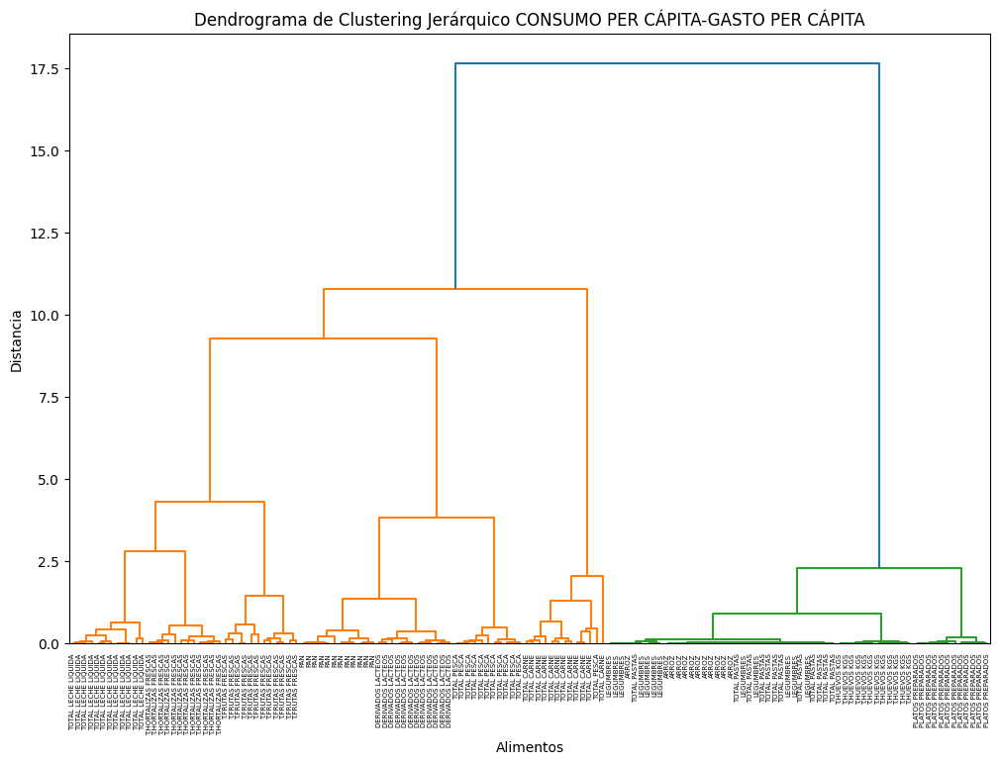

In [10]:
# CONSUMO PER CÁPITA-GASTO PER CÁPITA

# Agrupar datos por mes y tipo de alimento, calculando la media
df_grouped = df_nacional_filtrado.groupby(['Alimentos', 'Mes']).agg({
    'CONSUMO X CAPITA': 'mean',
    'GASTO X CAPITA': 'mean',
}).reset_index()

# Seleccionar las columnas relevantes para el clustering
df_clustering = df_grouped[['CONSUMO X CAPITA', 'GASTO X CAPITA']].copy()

# Estandarizar los datos
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_clustering)

# Aplicar el clustering jerárquico
linked = linkage(df_scaled, method='ward')

# Crear el dendrograma
plt.figure(figsize=(12, 8))
dendrogram(linked, orientation='top', distance_sort='descending', show_leaf_counts=True, labels=df_grouped['Alimentos'].values)
plt.title('Dendrograma de Clustering Jerárquico CONSUMO PER CÁPITA-GASTO PER CÁPITA')
plt.xlabel('Alimentos')
plt.ylabel('Distancia')
plt.xticks(rotation=90) 
plt.show()

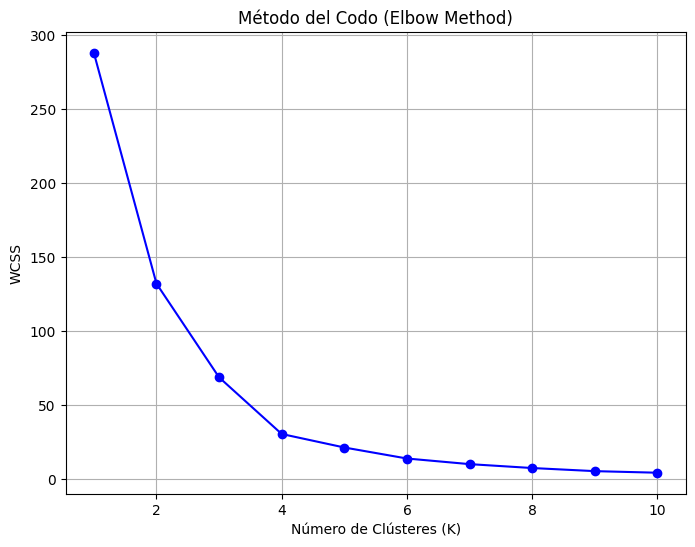

In [11]:
# Crear una lista para almacenar los valores de WCSS para diferentes valores de KMeans
wcss = []

# Probar diferentes valores de K para encontrar el número óptimo de clusters
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(df_scaled)
    wcss.append(kmeans.inertia_)  # Inertia es el valor de WCSS


plt.figure(figsize=(8, 6))
plt.plot(range(1, 11), wcss, marker='o', linestyle='-', color='b')
plt.title('Método del Codo (Elbow Method)')
plt.xlabel('Número de Clústeres (K)')
plt.ylabel('WCSS')
plt.grid(True)
plt.show()

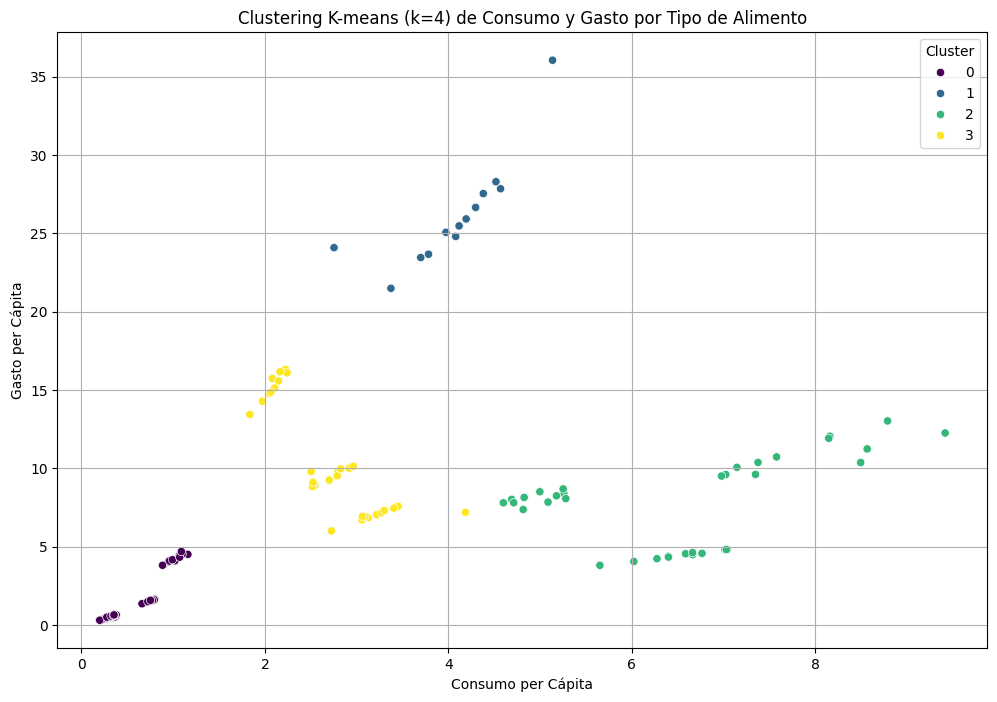

Centroides de los clusters:
           CONSUMO X CAPITA  GASTO X CAPITA
Cluster 0              0.55            1.46
Cluster 1              4.07           26.18
Cluster 2              6.52            7.80
Cluster 3              2.73           10.38
               Alimentos  Cluster
0                  ARROZ        0
1              LEGUMBRES        0
2      PLATOS PREPARADOS        0
3           T.HUEVOS KGS        0
4           TOTAL PASTAS        0
5            TOTAL CARNE        1
6            TOTAL PESCA        1
7       T.FRUTAS FRESCAS        2
8   T.HORTALIZAS FRESCAS        2
9    TOTAL LECHE LIQUIDA        2
10     DERIVADOS LACTEOS        3
11                   PAN        3
12  T.HORTALIZAS FRESCAS        3
13           TOTAL PESCA        3


In [12]:
clusters=4 #Seleccionar el resultado del WCSS
kmeans = KMeans(n_clusters=clusters, random_state=42)
df_grouped['Cluster'] = kmeans.fit_predict(df_scaled)

# Visualización del clustering con K-means
plt.figure(figsize=(12, 8))
sns.scatterplot(data=df_grouped, x='CONSUMO X CAPITA', y='GASTO X CAPITA', hue='Cluster', palette='viridis', marker='o')
plt.title('Clustering K-means (k=4) de Consumo y Gasto por Tipo de Alimento')
plt.xlabel('Consumo per Cápita')
plt.ylabel('Gasto per Cápita')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()

#Mostrar los centroides de los clusters
centroids = scaler.inverse_transform(kmeans.cluster_centers_)
centroids_df = pd.DataFrame(centroids, columns=['CONSUMO X CAPITA', 'GASTO X CAPITA'], index=[f'Cluster {i}' for i in range(4)])

print("Centroides de los clusters:")
print(centroids_df)

#Mostramos el dataframe con los alimentos y clusteres para ver las agrupacioens obtenidas.
unique_clusters = df_grouped[['Alimentos', 'Cluster']].drop_duplicates()
unique_clusters = unique_clusters.sort_values(by='Cluster')
unique_clusters = unique_clusters.reset_index(drop=True)
print(unique_clusters)

Cluster 0 agrupa alimentos como arroz, legumbres, platos preparados, huevos y pastas, con un consumo per cápita bajo y un gasto per cápita igualmente reducido. Estos alimentos básicos tienen un bajo nivel de gasto en comparación con otros grupos, reflejando su bajo costo y menor frecuencia de consumo.

Cluster 1 incluye carne y pescado, con un consumo per cápita moderado y un gasto per cápita significativamente alto. Esto indica que, aunque estos alimentos tienen un consumo relativamente mayor, su mayor costo resulta en un gasto elevado por persona.

Cluster 2 está compuesto por frutas frescas, hortalizas frescas y leche líquida. Estos alimentos presentan un alto consumo per cápita y un gasto per cápita moderado. La alta cantidad consumida está acompañada de un gasto relativamente menor, sugiriendo que estos productos, aunque consumidos en grandes cantidades, tienen precios accesibles.

Cluster 3 agrupa alimentos como derivados lácteos, pan y hortalizas frescas, con un consumo per cápita moderado y un gasto per cápita elevado. Este patrón refleja que, aunque el consumo es considerable, el gasto es relativamente alto, posiblemente debido a los precios más altos de estos alimentos.

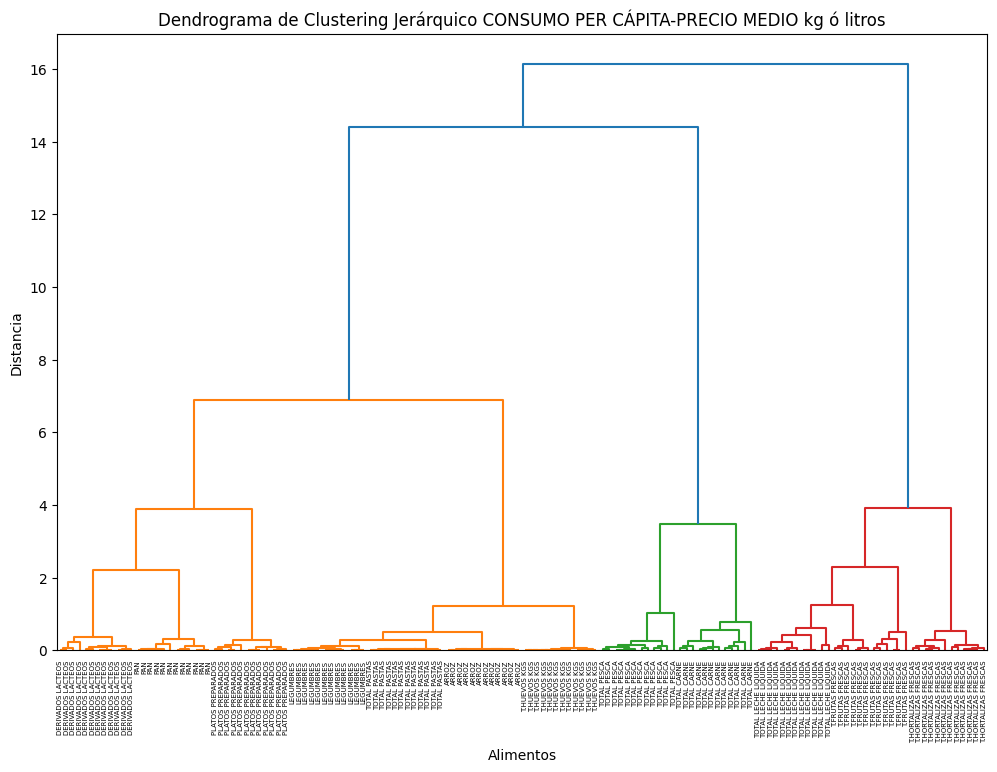

In [13]:
# CONSUMO PER CÁPITA-PRECIO MEDIO kg ó litros
# Agrupar datos por mes y tipo de alimento, calculando la media
df_grouped = df_nacional_filtrado.groupby(['Alimentos', 'Mes']).agg({
    'CONSUMO X CAPITA': 'mean',
    'PRECIO MEDIO kg ó litros': 'mean',
}).reset_index()

# Seleccionar las columnas relevantes para el clustering
df_clustering = df_grouped[['CONSUMO X CAPITA','PRECIO MEDIO kg ó litros']].copy()

# Estandarizar los datos
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_clustering)

# Aplicar el clustering jerárquico
linked = linkage(df_scaled, method='ward')

# Crear el dendrograma
plt.figure(figsize=(12, 8))
dendrogram(linked, orientation='top', distance_sort='descending', show_leaf_counts=True, labels=df_grouped['Alimentos'].values)
plt.title('Dendrograma de Clustering Jerárquico CONSUMO PER CÁPITA-PRECIO MEDIO kg ó litros')
plt.xlabel('Alimentos')
plt.ylabel('Distancia')
plt.xticks(rotation=90)  
plt.show()

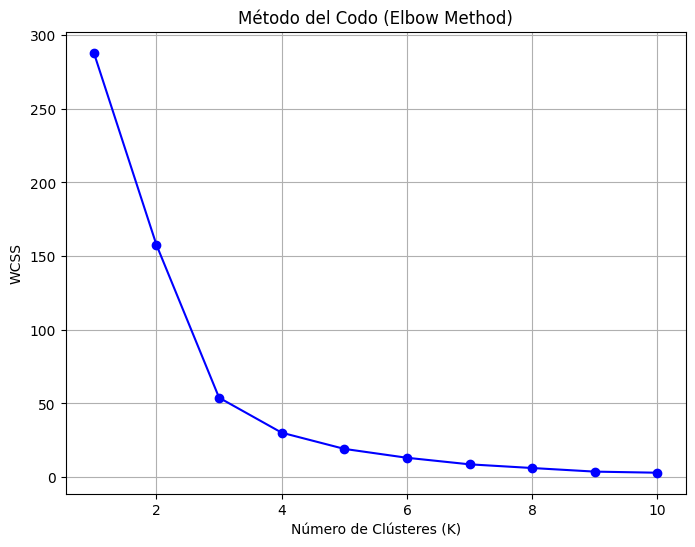

In [14]:
# Crear una lista para almacenar los valores de WCSS para diferentes valores de KMeans
wcss = []

# Probar diferentes valores de K para encontrar el número óptimo de clusters
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(df_scaled)
    wcss.append(kmeans.inertia_)  # Inertia es el valor de WCSS


plt.figure(figsize=(8, 6))
plt.plot(range(1, 11), wcss, marker='o', linestyle='-', color='b')
plt.title('Método del Codo (Elbow Method)')
plt.xlabel('Número de Clústeres (K)')
plt.ylabel('WCSS')
plt.grid(True)
plt.show()

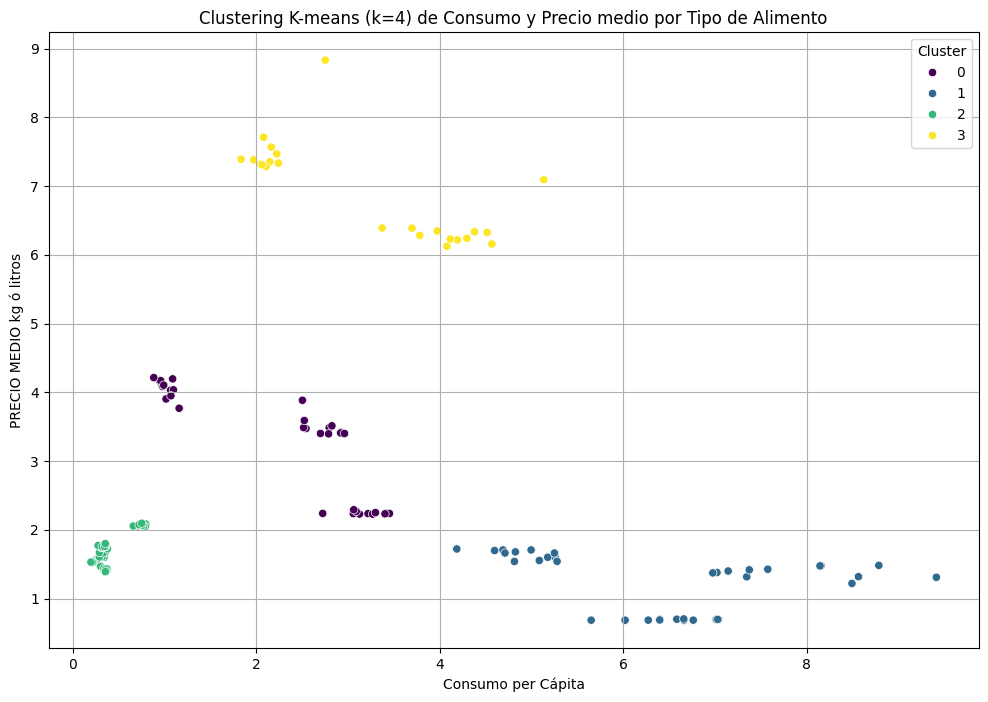

Centroides de los clusters:
           CONSUMO X CAPITA  PRECIO MEDIO kg ó litros
Cluster 0              2.31                      3.27
Cluster 1              6.45                      1.24
Cluster 2              0.43                      1.71
Cluster 3              3.16                      6.93
               Alimentos  Cluster
0      DERIVADOS LACTEOS        0
1                    PAN        0
2      PLATOS PREPARADOS        0
3       T.FRUTAS FRESCAS        1
4   T.HORTALIZAS FRESCAS        1
5    TOTAL LECHE LIQUIDA        1
6                  ARROZ        2
7              LEGUMBRES        2
8           T.HUEVOS KGS        2
9           TOTAL PASTAS        2
10           TOTAL CARNE        3
11           TOTAL PESCA        3


In [15]:
clusters=4 #Seleccionar el resultado del WCSS
kmeans = KMeans(n_clusters=clusters, random_state=42)
df_grouped['Cluster'] = kmeans.fit_predict(df_scaled)

# Visualización del clustering con K-means
plt.figure(figsize=(12, 8))
sns.scatterplot(data=df_grouped, x='CONSUMO X CAPITA', y='PRECIO MEDIO kg ó litros', hue='Cluster', palette='viridis', marker='o')
plt.title('Clustering K-means (k=4) de Consumo y Precio medio por Tipo de Alimento')
plt.xlabel('Consumo per Cápita')
plt.ylabel('PRECIO MEDIO kg ó litros')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()

# Opcional: Mostrar los centroides de los clusters
centroids = scaler.inverse_transform(kmeans.cluster_centers_)
centroids_df = pd.DataFrame(centroids, columns=['CONSUMO X CAPITA', 'PRECIO MEDIO kg ó litros'], index=[f'Cluster {i}' for i in range(4)])

print("Centroides de los clusters:")
print(centroids_df)

#Mostramos el dataframe con los alimentos y clusteres para ver las agrupacioens obtenidas.
unique_clusters = df_grouped[['Alimentos', 'Cluster']].drop_duplicates()
unique_clusters = unique_clusters.sort_values(by='Cluster')
unique_clusters = unique_clusters.reset_index(drop=True)
print(unique_clusters)

En el Cluster 0, que incluye derivados lácteos, pan y platos preparados, se observa un consumo per cápita moderado combinado con un precio medio relativamente bajo. Estos alimentos son esenciales y frecuentemente consumidos en la dieta diaria, con precios accesibles que reflejan su alta disponibilidad y demanda.

El Cluster 1 está dominado por frutas frescas, hortalizas frescas y leche líquida, que tienen un consumo per cápita alto y precios medios bajos. Esto indica que estos alimentos saludables y frescos tienen una gran aceptación y son consumidos en grandes cantidades, con precios accesibles que facilitan su inclusión en la dieta diaria.

En el Cluster 2, compuesto por arroz, legumbres, huevos y pastas, se observa un bajo consumo per cápita con precios medios relativamente bajos. Esto sugiere que, aunque estos alimentos básicos están presentes en la dieta, su consumo es menos frecuente comparado con otros grupos, y los precios bajos pueden contribuir a su accesibilidad.

El Cluster 3 incluye carne y pescado, que tienen un consumo per cápita moderado y precios medios elevados. Estos alimentos son menos accesibles debido a su mayor precio, lo que puede limitar su frecuencia de consumo en comparación con otros grupos alimenticios.

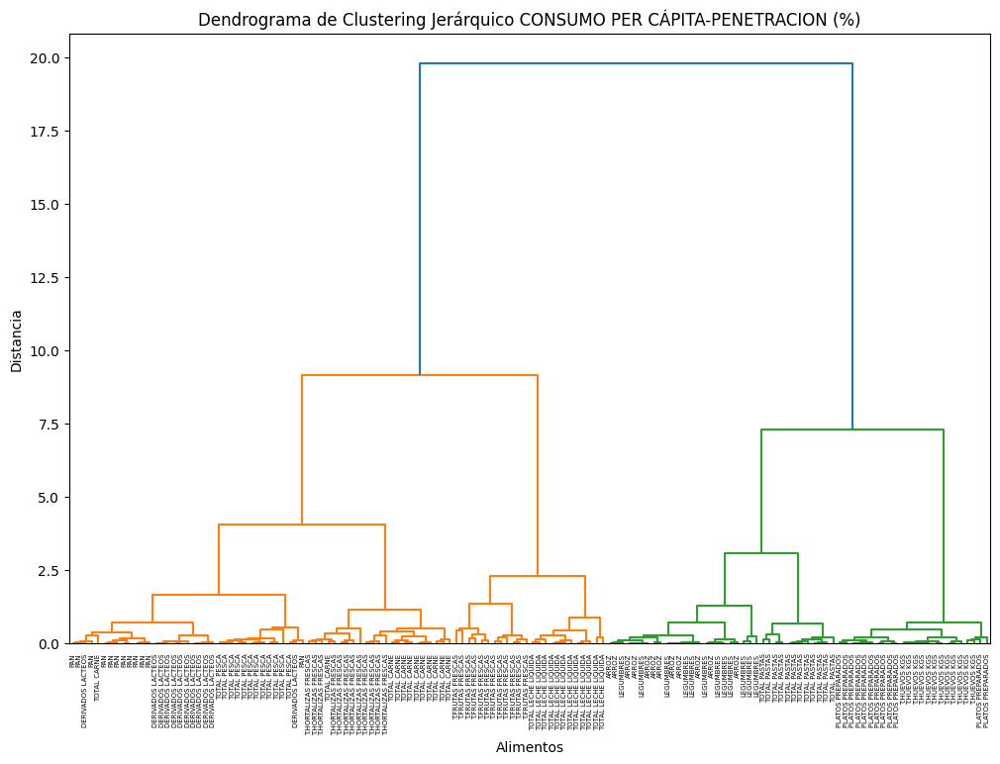

In [16]:
# CONSUMO PER CÁPITA-PENETRACION (%)
# Agrupar datos por mes y tipo de alimento, calculando la media
df_grouped = df_nacional_filtrado.groupby(['Alimentos', 'Mes']).agg({
    'CONSUMO X CAPITA': 'mean',
    'PENETRACION (%)': 'mean',
}).reset_index()

# Seleccionar las columnas relevantes para el clustering
df_clustering = df_grouped[['CONSUMO X CAPITA','PENETRACION (%)']].copy()

# Estandarizar los datos
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_clustering)

# Aplicar el clustering jerárquico
linked = linkage(df_scaled, method='ward')

# Crear el dendrograma
plt.figure(figsize=(12, 8))
dendrogram(linked, orientation='top', distance_sort='descending', show_leaf_counts=True, labels=df_grouped['Alimentos'].values)
plt.title('Dendrograma de Clustering Jerárquico CONSUMO PER CÁPITA-PENETRACION (%)')
plt.xlabel('Alimentos')
plt.ylabel('Distancia')
plt.xticks(rotation=90)  
plt.show()

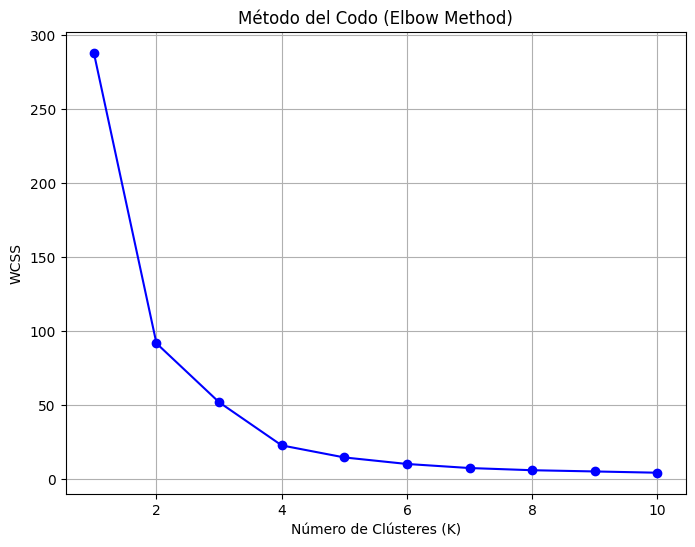

In [17]:
# Crear una lista para almacenar los valores de WCSS para diferentes valores de KMeans
wcss = []

# Probar diferentes valores de K para encontrar el número óptimo de clusters
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(df_scaled)
    wcss.append(kmeans.inertia_)  # Inertia es el valor de WCSS


plt.figure(figsize=(8, 6))
plt.plot(range(1, 11), wcss, marker='o', linestyle='-', color='b')
plt.title('Método del Codo (Elbow Method)')
plt.xlabel('Número de Clústeres (K)')
plt.ylabel('WCSS')
plt.grid(True)

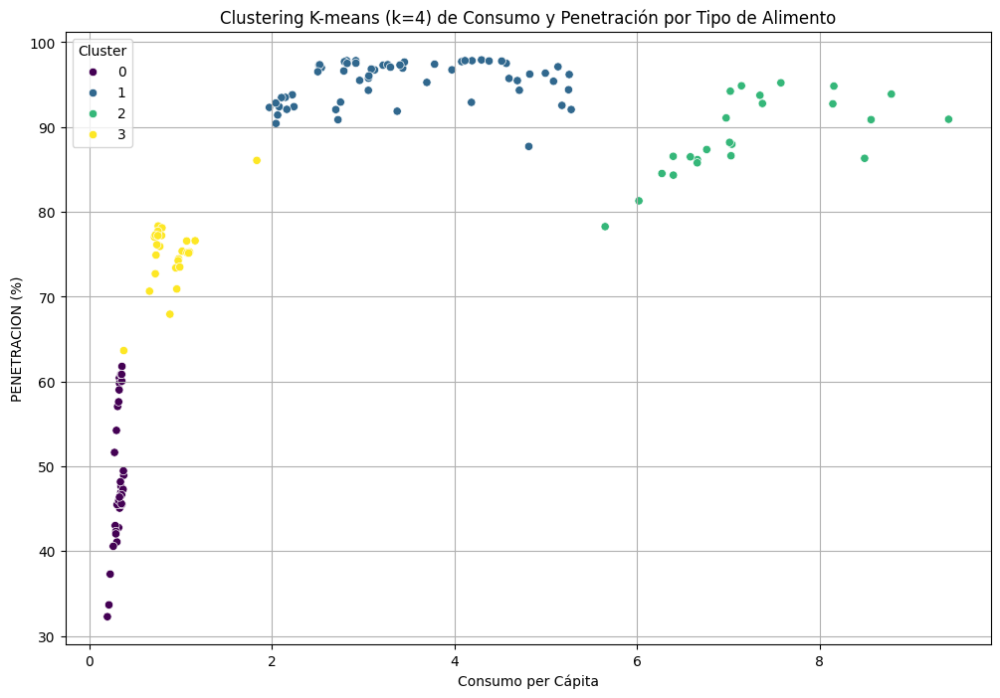

Centroides de los clusters:
           CONSUMO X CAPITA  PENETRACION (%)
Cluster 0              0.32            48.56
Cluster 1              3.46            95.33
Cluster 2              7.23            88.96
Cluster 3              0.90            75.06
               Alimentos  Cluster
0                  ARROZ        0
1              LEGUMBRES        0
2           TOTAL PASTAS        0
3      DERIVADOS LACTEOS        1
4                    PAN        1
5   T.HORTALIZAS FRESCAS        1
6            TOTAL CARNE        1
7            TOTAL PESCA        1
8       T.FRUTAS FRESCAS        2
9    TOTAL LECHE LIQUIDA        2
10     PLATOS PREPARADOS        3
11          T.HUEVOS KGS        3
12          TOTAL PASTAS        3
13           TOTAL PESCA        3


In [18]:
clusters=4 #Seleccionar el resultado del WCSS
kmeans = KMeans(n_clusters=clusters, random_state=42)
df_grouped['Cluster'] = kmeans.fit_predict(df_scaled)

# Visualización del clustering con K-means
plt.figure(figsize=(12, 8))
sns.scatterplot(data=df_grouped, x='CONSUMO X CAPITA', y='PENETRACION (%)', hue='Cluster', palette='viridis', marker='o')
plt.title('Clustering K-means (k=4) de Consumo y Penetración por Tipo de Alimento')
plt.xlabel('Consumo per Cápita')
plt.ylabel('PENETRACION (%)')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()

# Opcional: Mostrar los centroides de los clusters
centroids = scaler.inverse_transform(kmeans.cluster_centers_)
centroids_df = pd.DataFrame(centroids, columns=['CONSUMO X CAPITA', 'PENETRACION (%)'], index=[f'Cluster {i}' for i in range(4)])

print("Centroides de los clusters:")
print(centroids_df)

#Mostramos el dataframe con los alimentos y clusteres para ver las agrupacioens obtenidas.
unique_clusters = df_grouped[['Alimentos', 'Cluster']].drop_duplicates()
unique_clusters = unique_clusters.sort_values(by='Cluster')
unique_clusters = unique_clusters.reset_index(drop=True)
print(unique_clusters)

El Cluster 0 incluye alimentos básicos como arroz y legumbres con bajo consumo per cápita y una penetración moderada, indicando que son consumidos por una parte significativa de la población pero no en grandes cantidades. El Cluster 1 agrupa productos esenciales como derivados lácteos, pan, carne, pescado y hortalizas, que tienen un alto consumo per cápita y una penetración casi universal, reflejando su importancia en la dieta diaria a nivel nacional. En el Cluster 2, frutas frescas y leche líquida muestran un consumo per cápita muy alto y una alta penetración, lo que sugiere una fuerte preferencia y un alto volumen de consumo. Finalmente, el Cluster 3 incluye alimentos como platos preparados, huevos y pasta, además parte de pescado con un consumo moderado y una penetración también moderada, indicando una presencia significativa pero no dominante en la dieta.

## ANÁLISIS CONSUMO PER CÁPITA CON IPC

Hemos observado que el precio medio presenta una correlación moderada a fuerte con varias de las series temporales que estamos modelando. Por ello, se ha decidido incluir la variable del Índice de Precios al Consumo (IPC) específico de alimentos y bebidas no alcohólicas. Esta variable, actualizada mensualmente por el INE y con proyecciones futuras disponibles, facilitará la incorporación de una variable exógena en nuestros modelos, simplificando el proceso al evitar la necesidad de modelar directamente el precio medio para pronosticos futuros.

El IPC específico de alimentos y bebidas no alcohólicas mide los cambios en los precios de una cesta representativa de bienes y servicios en esta categoría, siendo un componente clave del IPC general. Este índice permite rastrear las fluctuaciones de precios en el sector específico de alimentos y bebidas no alcohólicas a lo largo del tiempo.

El INE proporciona datos del IPC desde 2002 hasta 2024. Dado este rango de fechas, tenemos dos opciones a considerar: primero, podríamos reducir nuestro histórico de datos eliminando los años 1999 a 2001 para alinear nuestro análisis con el período disponible del IPC; segundo, podríamos utilizar técnicas de bootstrapping para generar datos para estos años faltantes basándonos en el histórico disponible. Antes de tomar una decisión, evaluaremos si la variable IPC muestra una correlación significativa con nuestra variable de interés y valoraremos que opción es más adecuada para nuestro análisis.

In [19]:
ruta_archivo='./Dataset/Dataset_origen/IPC_2002_2023.xlsx'
ipc_data = pd.read_excel(ruta_archivo)
ipc_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 3 columns):
 #   Column                                 Non-Null Count  Dtype 
---  ------                                 --------------  ----- 
 0   IPC Alimentos y bebidas no alcholicas  300 non-null    object
 1   Mes                                    300 non-null    int64 
 2   Año                                    300 non-null    int64 
dtypes: int64(2), object(1)
memory usage: 7.2+ KB


In [20]:
ipc_data['IPC Alimentos y bebidas no alcholicas'] = pd.to_numeric(ipc_data['IPC Alimentos y bebidas no alcholicas'], errors='coerce')
ipc_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 3 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   IPC Alimentos y bebidas no alcholicas  264 non-null    float64
 1   Mes                                    300 non-null    int64  
 2   Año                                    300 non-null    int64  
dtypes: float64(1), int64(2)
memory usage: 7.2 KB


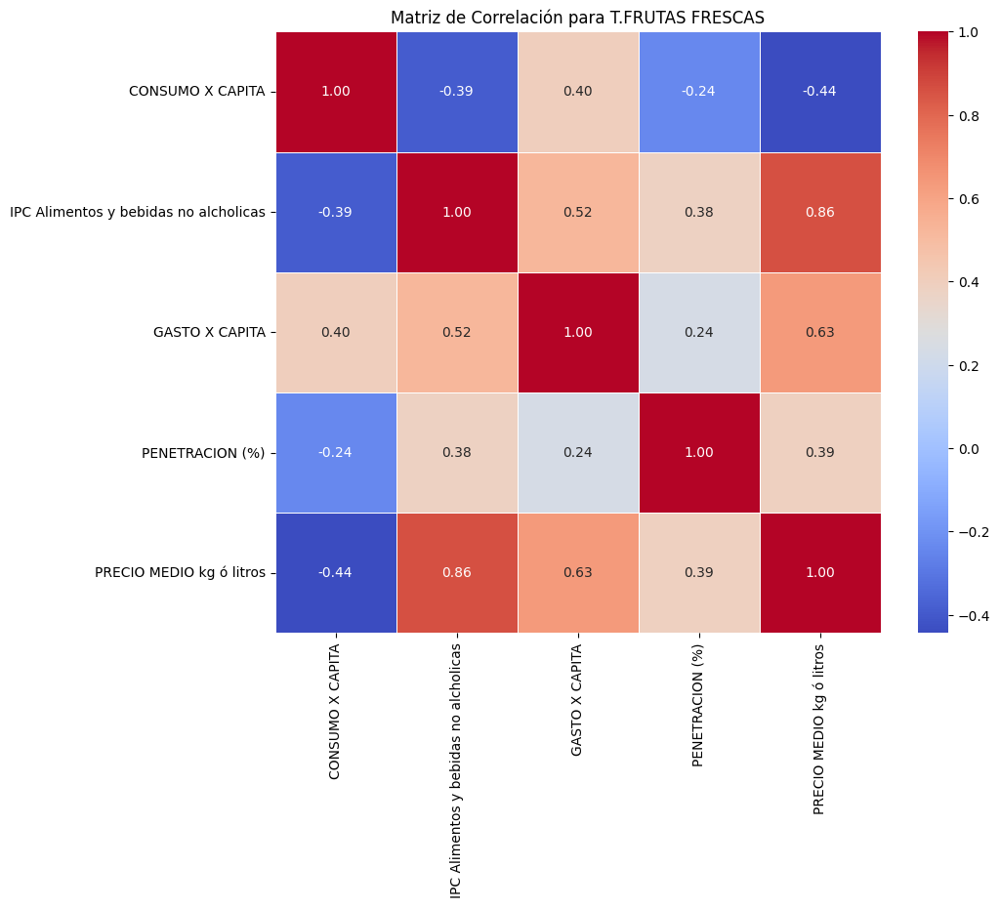

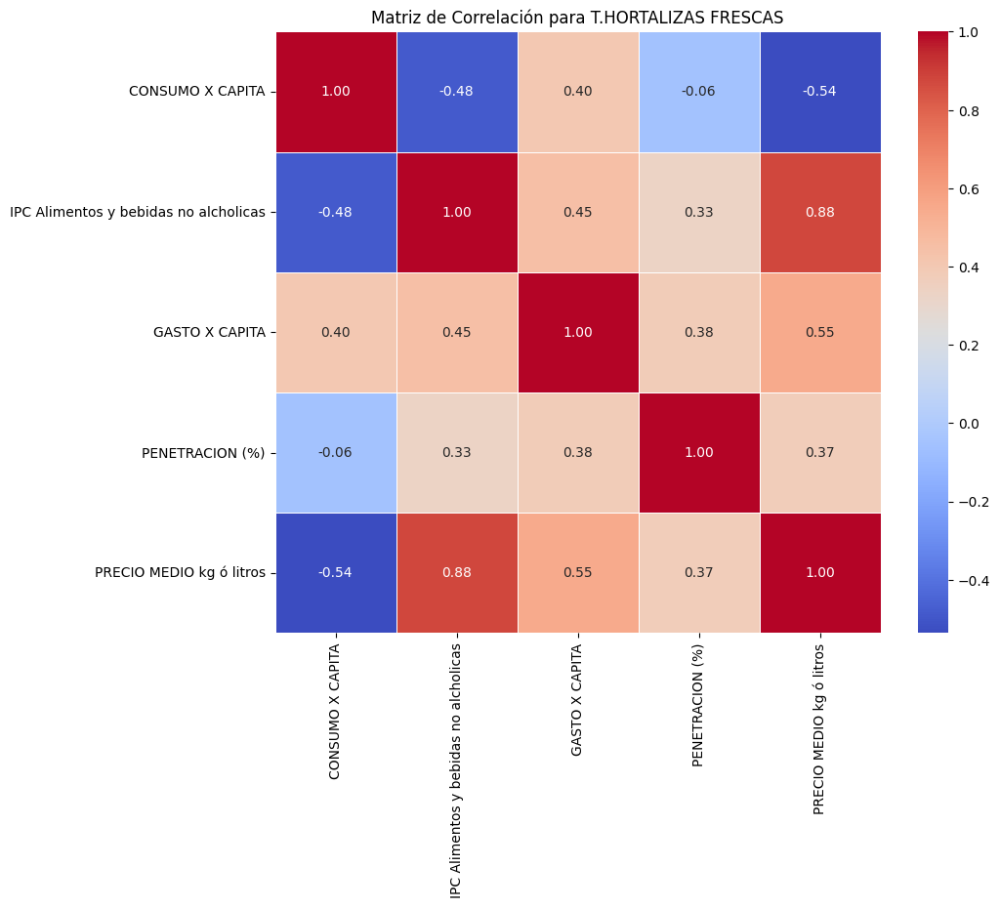

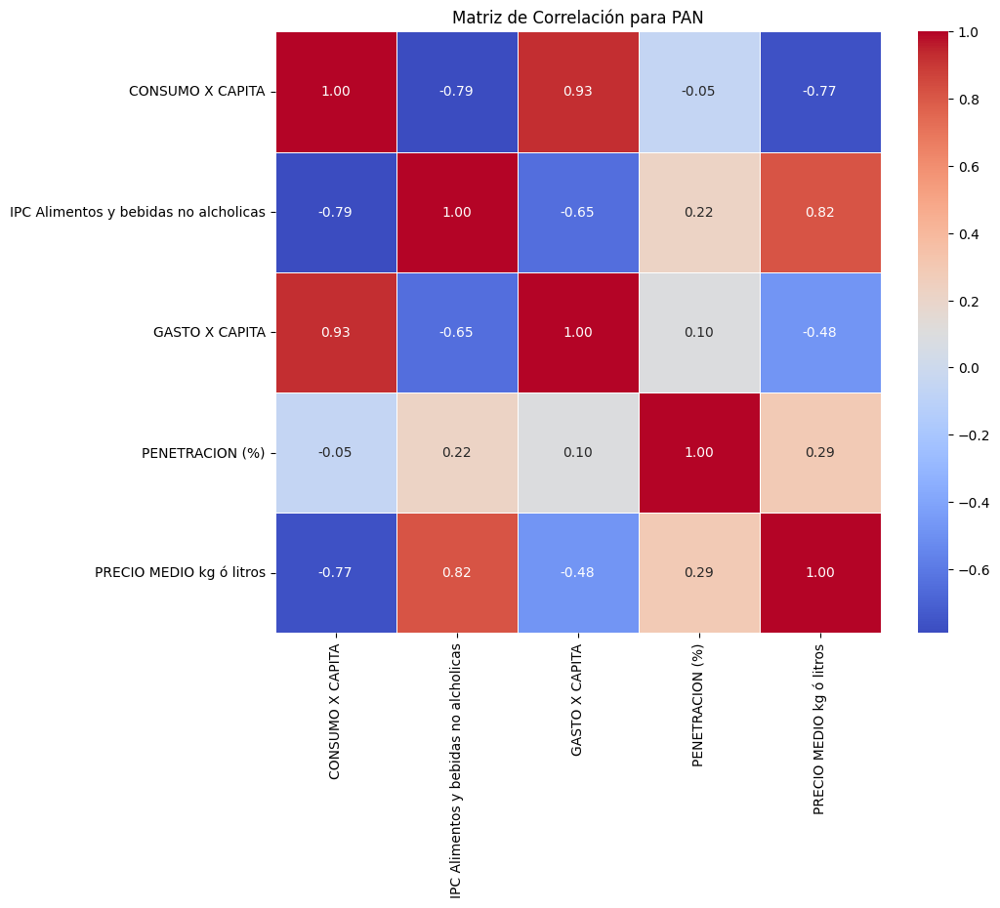

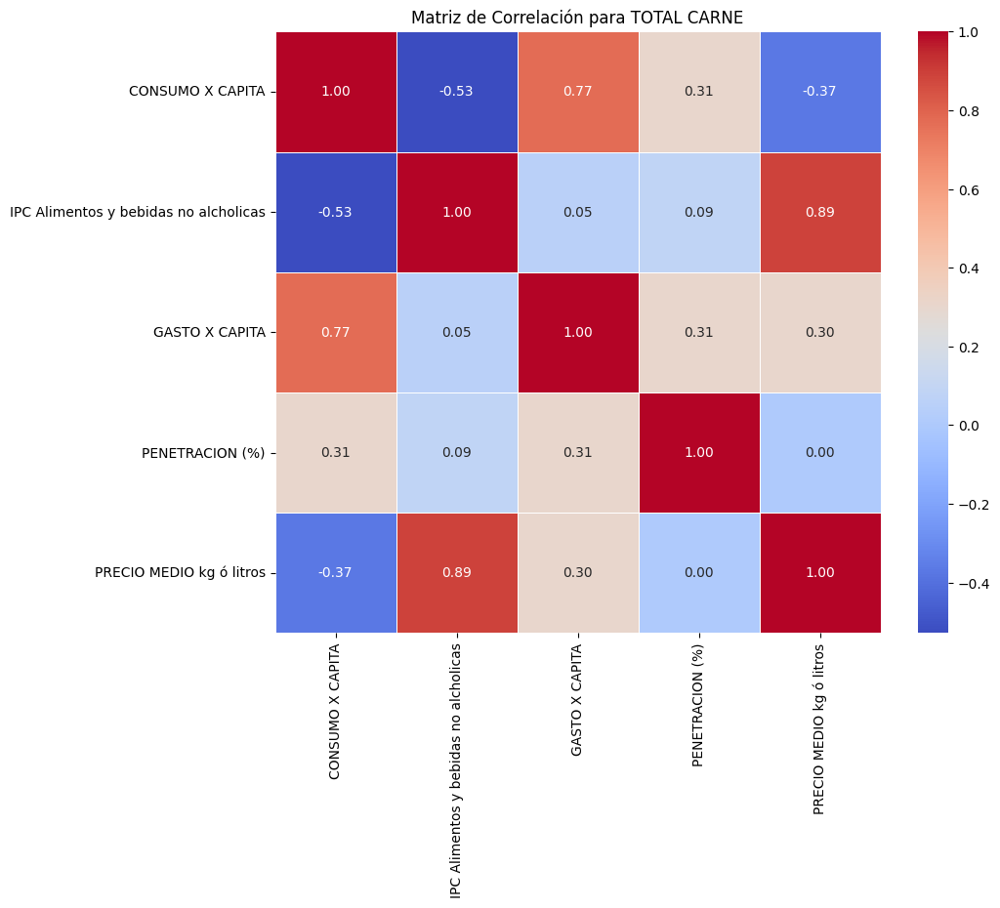

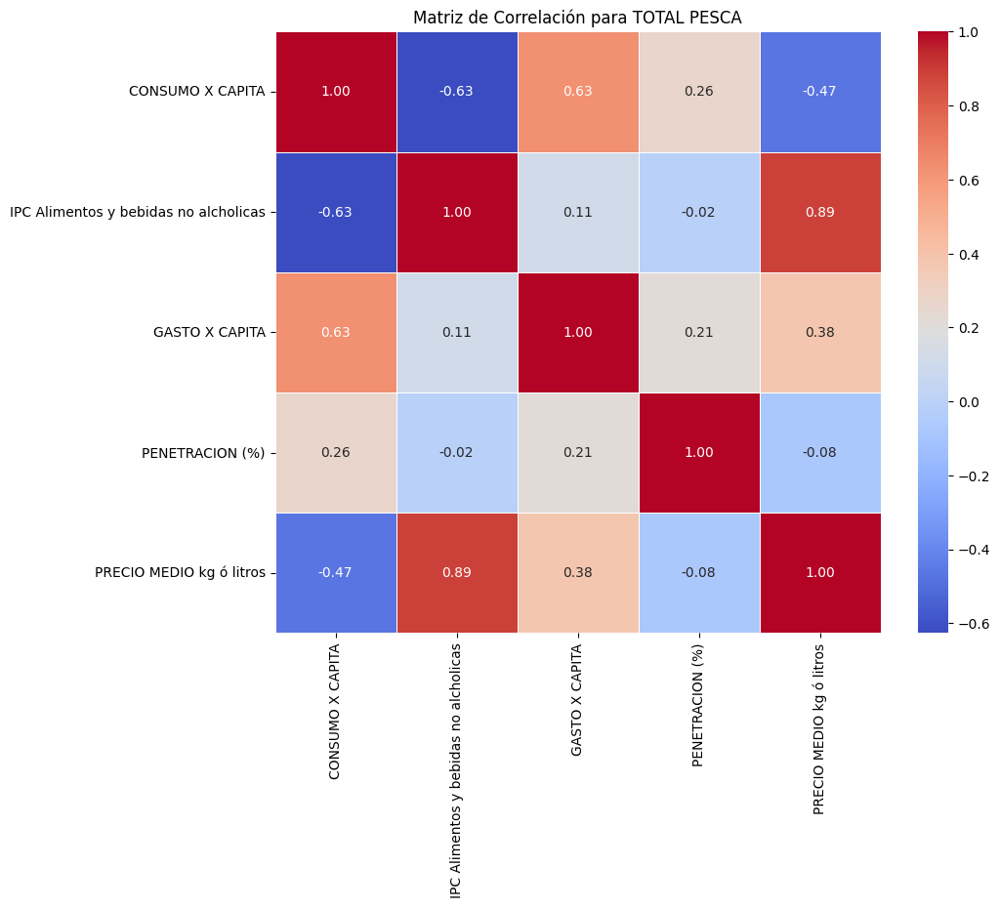

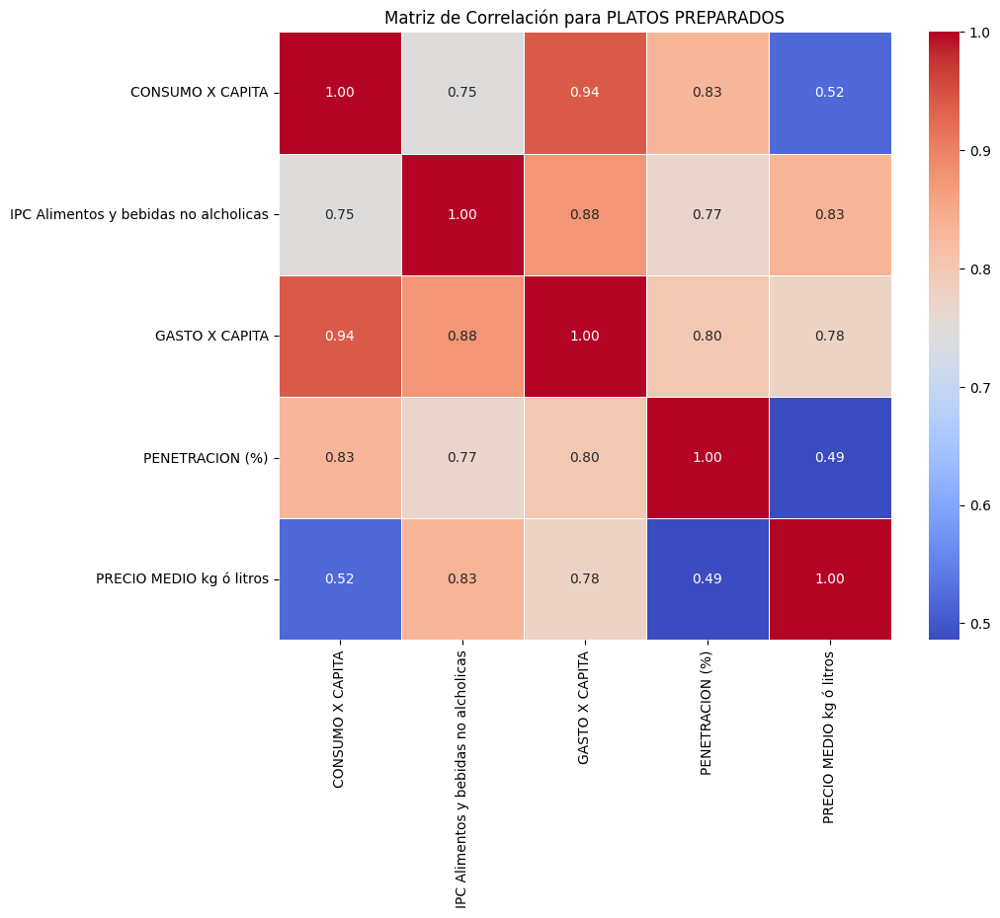

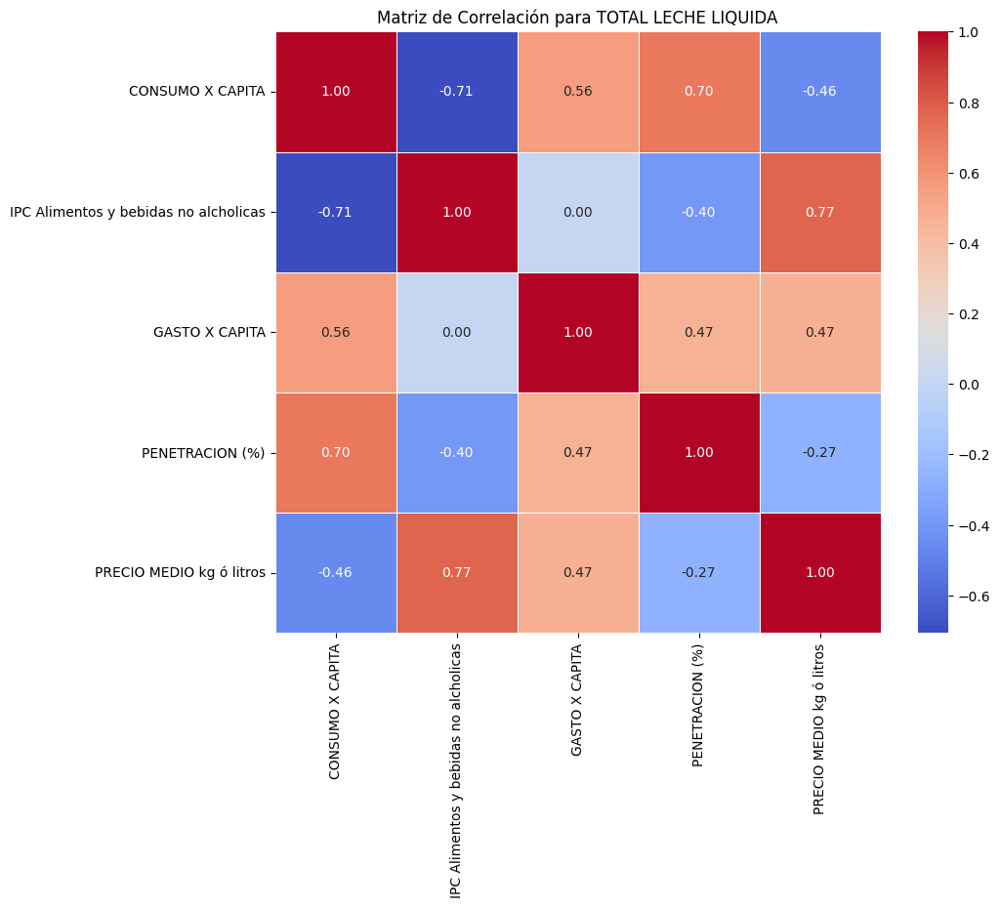

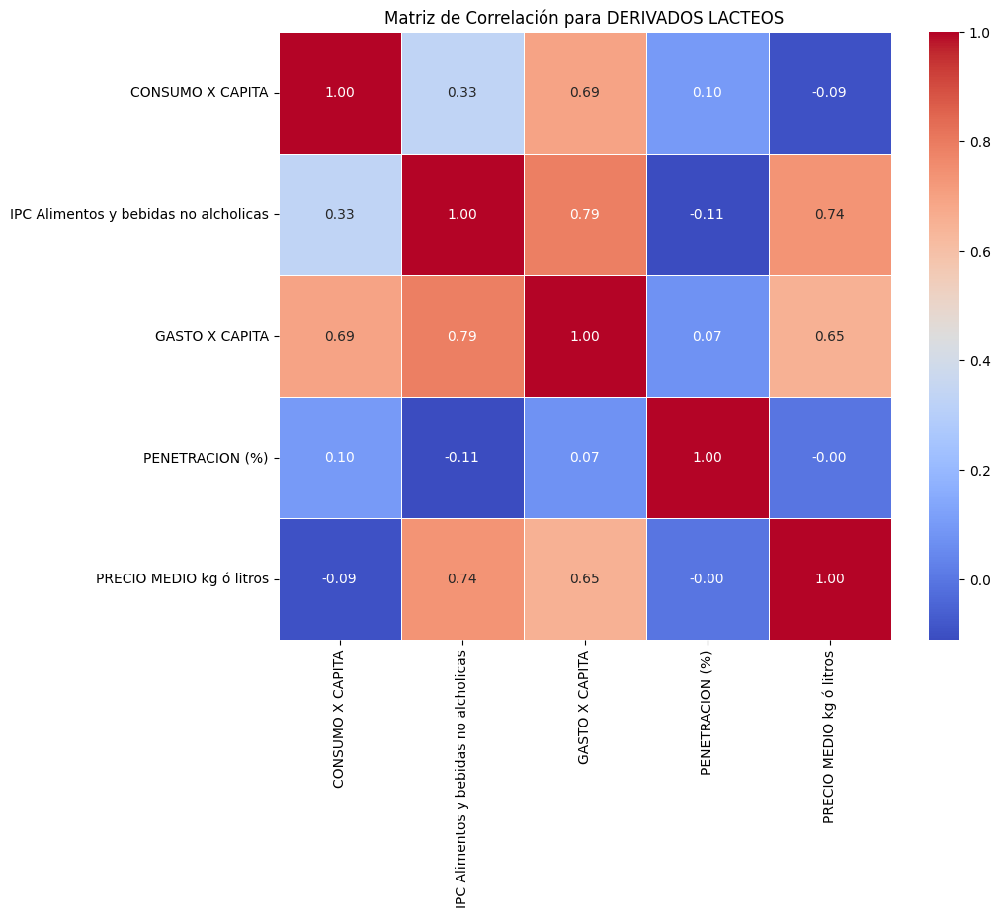

In [21]:
for alimento in seleccion_alimentos:
    # Filtrar datos para el alimento actual
    df_alimento = df_nacional_filtrado[df_nacional_filtrado['Alimentos'] == alimento]
    
    # Convertir las columnas 'Año' y 'Mes' a numérico
    df_alimento['Año'] = pd.to_numeric(df_alimento['Año'], errors='coerce')
    df_alimento['Mes'] = pd.to_numeric(df_alimento['Mes'], errors='coerce')
    
    # Filtrar para eliminar los años 1999, 2000, 2001 y 2024
    df_alimento = df_alimento[~df_alimento['Año'].isin([1999, 2000, 2001, 2024])]
    
    # Combinar df_alimento con ipc_data basado en 'Mes' y 'Año'
    df_combinado = pd.merge(df_alimento, ipc_data, on=['Mes', 'Año'], how='left')
    
    # Convertir la columna 'Fecha' a datetime si no lo está
    df_combinado['Fecha'] = pd.to_datetime(df_combinado['Fecha'], errors='coerce')
    
    # Establecer la columna 'Fecha' como índice y ordenar por ella
    df_combinado.set_index('Fecha', inplace=True)
    df_combinado.sort_index(inplace=True)

     # Calcular la matriz de correlación para las columnas de interés
    var_num = df_combinado[['CONSUMO X CAPITA', 'IPC Alimentos y bebidas no alcholicas', 'GASTO X CAPITA', 'PENETRACION (%)',
                           'PRECIO MEDIO kg ó litros']]
    R = var_num.corr()
    
    # Crear una figura y un gráfico
    plt.figure(figsize=(10, 8))
    sns.heatmap(R, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
    plt.title(f'Matriz de Correlación para {alimento}')
    plt.show()
    

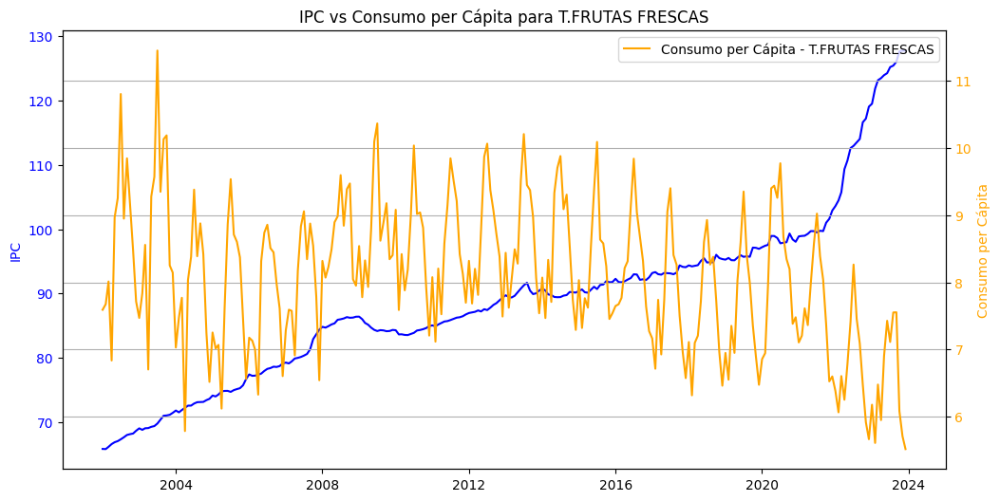

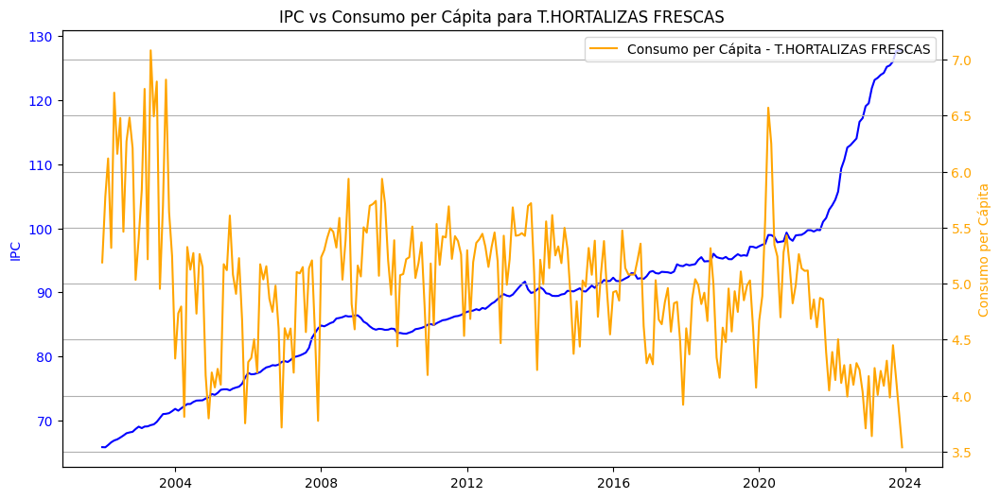

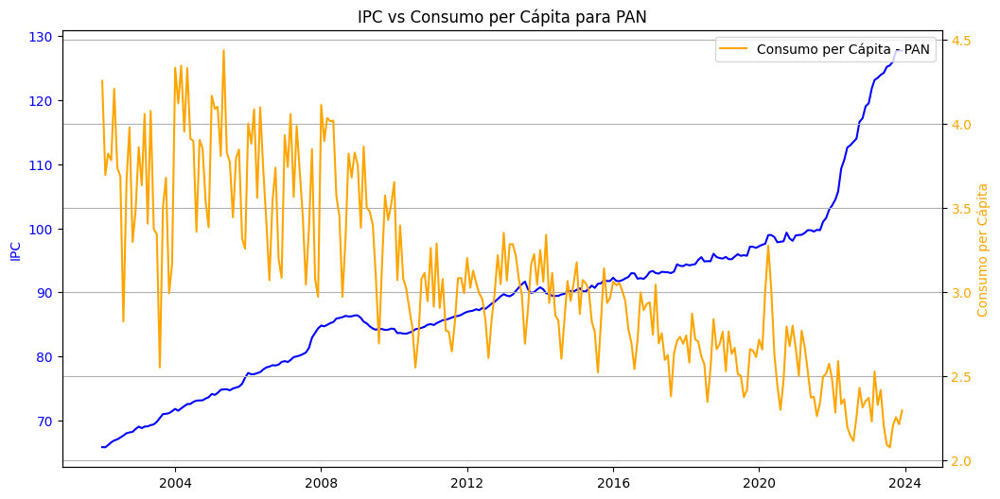

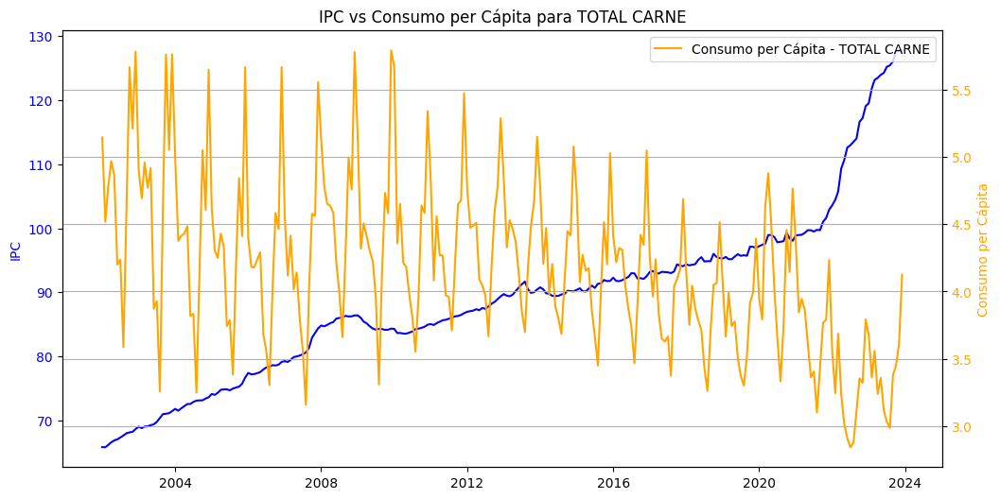

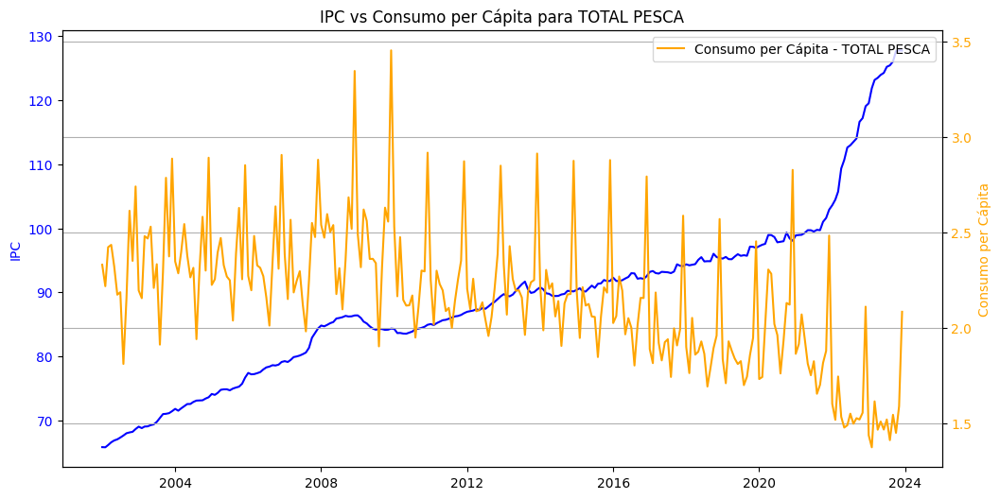

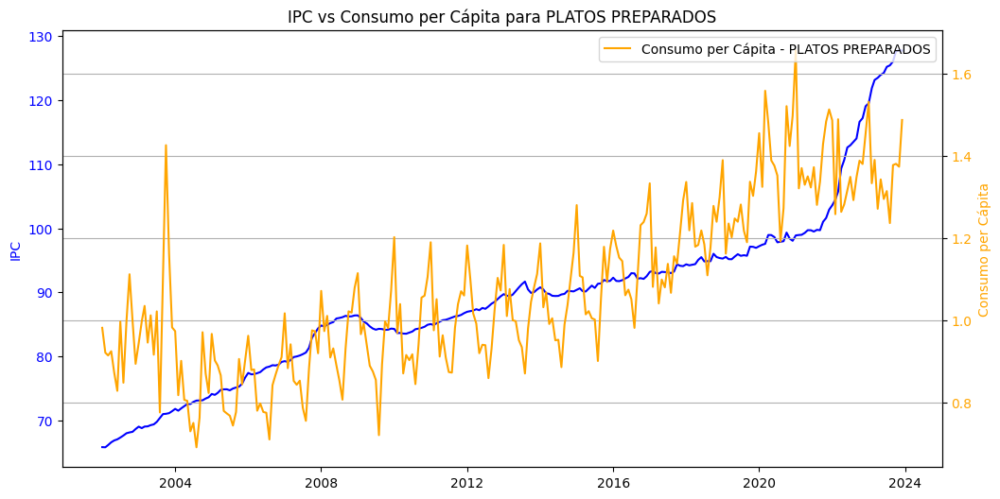

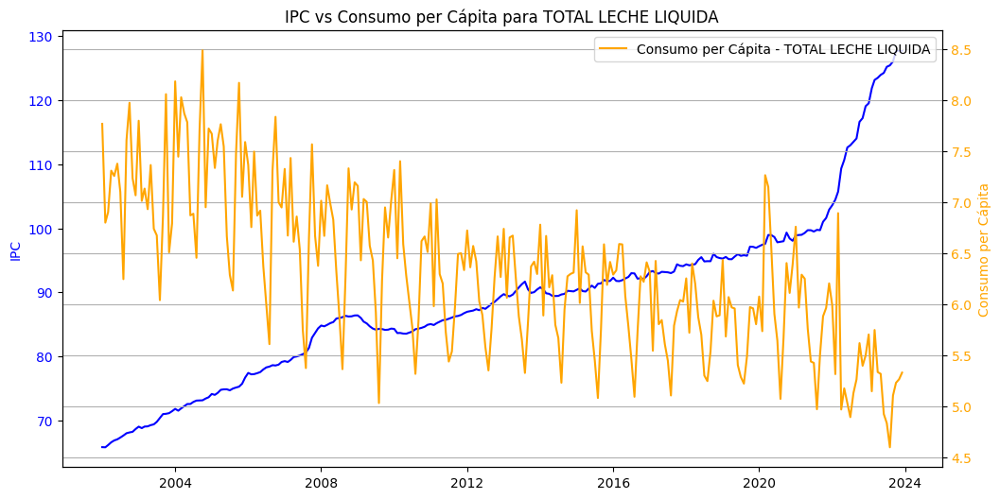

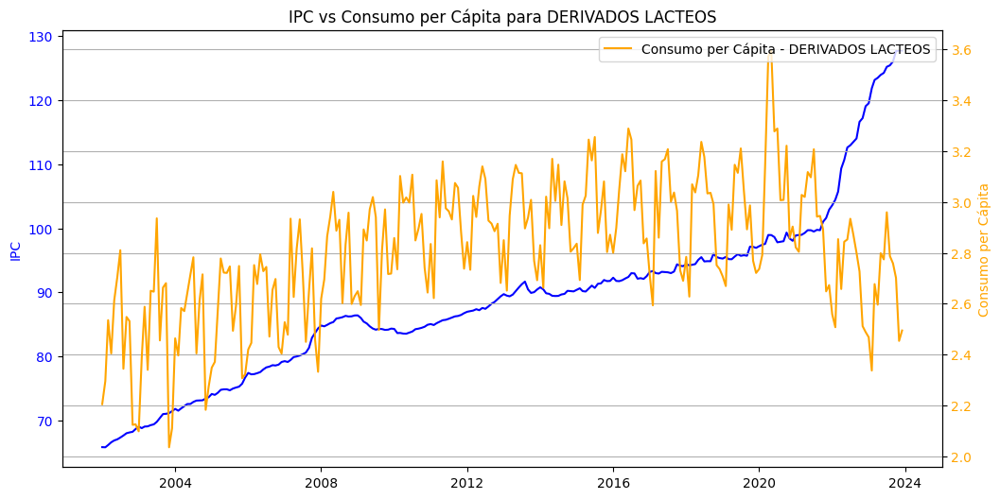

In [22]:
for alimento in seleccion_alimentos:
    # Filtrar datos para el alimento actual
    df_alimento = df_nacional_filtrado[df_nacional_filtrado['Alimentos'] == alimento]
    df_alimento['Año'] = pd.to_numeric(df_alimento['Año'], errors='coerce')
    df_alimento['Mes'] = pd.to_numeric(df_alimento['Mes'], errors='coerce')
    df_alimento = df_alimento[~df_alimento['Año'].isin([1999, 2000, 2001, 2024])]
    df_combinado = pd.merge(df_alimento, ipc_data, on=['Mes', 'Año'], how='left')
    # Convertir la columna 'Fecha' a datetime si no lo está
    df_combinado['Fecha'] = pd.to_datetime(df_combinado['Fecha'], errors='coerce')
    
    # Establecer la columna 'Fecha' como índice y ordenar por ella
    df_combinado.set_index('Fecha', inplace=True)
    df_combinado.sort_index(inplace=True)
    
        # Graficar IPC y Consumo per cápita con dos ejes Y
    plt.figure(figsize=(12, 6))

    # Eje Y principal para IPC
    plt.plot(df_combinado.index, df_combinado['IPC Alimentos y bebidas no alcholicas'], label='IPC Alimentos y Bebidas No Alcohólicas', color='blue')
    plt.ylabel('IPC', color='blue')
    plt.tick_params(axis='y', labelcolor='blue')

    # Crear un segundo eje Y para Consumo per cápita
    ax2 = plt.gca().twinx()  # Crea un segundo eje Y que comparte el mismo eje X
    ax2.plot(df_combinado.index, df_combinado['CONSUMO X CAPITA'], label=f'Consumo per Cápita - {alimento}', color='orange')
    ax2.set_ylabel('Consumo per Cápita', color='orange')
    ax2.tick_params(axis='y', labelcolor='orange')

    # Configuración del gráfico
    plt.title(f'IPC vs Consumo per Cápita para {alimento}')
    plt.xlabel('Fecha')
    plt.grid(True)

    # Agregar leyenda para el primer eje Y
    plt.legend(loc='upper left')

    # Agregar leyenda para el segundo eje Y
    ax2.legend(loc='upper right')

    plt.show()

Durante el periodo analizado (1999-2023), la correlación entre el consumo per cápita y el IPC para "Derivados Lácteos" mostró una relación baja pero positiva, mientras que para "Platos Preparados" fue moderada. En el análisis más reciente, la correlación para "Derivados Lácteos" ha disminuido y se ha acercado a cero, mientras que para "Platos Preparados" la correlación ha reducido, manteniéndose en un rango bajo a moderado.

Por otro lado, se observa que el IPC tiene una relación fuerte con "Total Leche Líquida", "Pesca" y "Pan", siendo esta relación inversa en el caso de "Leche Líquida" y "Pan", y positiva para "Platos Preparados". Estas observaciones sugieren que el IPC tiene un impacto significativo y diferenciable sobre el consumo per cápita de estos alimentos, indicando que la variación en el IPC puede influir de manera considerable en el consumo de ciertos productos. Aquí podríamos tener en cuenta esta variable exógena de IPC para el modelado específico posterior de estas series. 

# GRAFICOS INTERACTIVOS

## GRÁFICO INTERACTIVO: series por tipo de alimento

En el siguiente gráfico realizado con plotly se puede realizar una visualización de cada variable del dataset: consumo, gasto, penetración valro y volumen seleccionado que tipo de alimento se desea mostrar en el gráfico. 

In [23]:
variables = [
    'CONSUMO X CAPITA',
    'GASTO X CAPITA',
    'PENETRACION (%)',
    'PRECIO MEDIO kg ó litros',
    'VALOR (Miles Euros)',
    'VOLUMEN (Miles kg ó litros)'
]

alimentos = [
    'T.FRUTAS FRESCAS', 'T.HORTALIZAS FRESCAS', 'TOTAL PASTAS', 'ARROZ', 'PAN',
    'TOTAL CARNE', 'TOTAL PESCA', 'T.HUEVOS KGS', 'LEGUMBRES', 'PLATOS PREPARADOS',
    'TOTAL LECHE LIQUIDA', 'DERIVADOS LACTEOS'
]

df_nacional_filtrado['Fecha'] = pd.to_datetime(df_nacional_filtrado['Fecha'])
df_nacional_filtrado = df_nacional_filtrado.sort_values(by='Fecha')
df_nacional_filtrado = df_nacional_filtrado.reset_index(drop=True)




fig = go.Figure()


for var in variables:
    for alimento in alimentos:
        # Filtrar datos para el alimento actual
        df_filtered = df_nacional_filtrado[df_nacional_filtrado['Alimentos'] == alimento]
        
        # Añadir traza para la combinación de columna y alimento
        fig.add_trace(
            go.Scatter(
                x=df_filtered['Fecha'],
                y=df_filtered[var],
                name=f"{alimento} - {var}",  # Nombre de la traza
                mode='lines',
                visible='legendonly',  # Inicialmente solo en la leyenda
                hovertemplate='%{y:.2f}<extra></extra>'
            )
        )

# Crear botones para el menú desplegable
buttons = [
    dict(
        label=var,
        method="update",
        args=[{
            "visible": [True if trace.name.split(' - ')[1] == var else False for trace in fig.data]
        },
        {"title": f"Métrica: {var}"}]
    ) for var in variables
]

# Configurar el diseño del gráfico
fig.update_layout(
    title='Métricas por Tipo de Alimento',
    xaxis_title='Fecha',
    yaxis_title='Valor métrica',
    width=1200,
    height=600,
    updatemenus=[
        dict(
            type="dropdown",
            buttons=buttons,
            direction="down",
            showactive=True,
            x=0.7,
            xanchor="left",
            y=1.15,
            yanchor="top"
        ) 
    ]
)

fig.show()